## Module 4: Lens Modeling & Subhalo Detection

### Purpose
Attempt to recover the injected subhalos from the simulated observations using lens modeling techniques, quantifying detection significance.

Use Bayesian Evidence (lnZ) approach to detect.

In [14]:
# ========================================
# Cell 1: Imports and Environment Setup
# ========================================

import yaml
import autolens as al
import autofit as af
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import datetime
import json

# Set environment variables to avoid multiprocessing oversubscription issues.
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["VECLIB_MAXIMUM_THREADS"] = "1"
os.environ["NUMEXPR_NUM_THREADS"] = "1"
# Additional critical threading controls
os.environ["BLAS_NUM_THREADS"] = "1"
os.environ["LAPACK_NUM_THREADS"] = "1"

# --- 1. SETUP: Set Paths and Imports ---

# Add hwoslaps to path to import our modules
# (Assuming your notebook is in the root of the hwo-slaps directory)
sys.path.insert(0, str(Path.cwd()))
from hwoslaps.lensing import generate_lensing_system
from hwoslaps.psf import generate_psf_system
from hwoslaps.observation import generate_observation

windows_path = '/home/wslgeorgios'
mac_path = '/Users/vassilak/research/hwo'

# Make it a use mac path true or false, and then set the path accordingly
use_mac_path = True
if use_mac_path:
    base_path = mac_path
else:
    base_path = windows_path

# Use the exact paths you provided
config_path = f'{base_path}/hwo-slaps/configs/master_config.yaml'
output_path_prefix = f'{base_path}/outputs/proto'

# Print the paths to verify
print(f"Config Path: {config_path}")
print(f"Output Path Prefix: {output_path_prefix}")
print(f"Current Working Directory: {Path.cwd()}")

# Set up plotting
plt.style.use('default')
# %matplotlib inline  # Uncomment in Jupyter

# Configure autofit
af.conf.instance.max_cpus = 1  # Use single CPU for testing

# Create output directory if it doesn't exist
Path(output_path_prefix).mkdir(parents=True, exist_ok=True)
print(f"Output directory ready: {output_path_prefix}")

Config Path: /Users/vassilak/research/hwo/hwo-slaps/configs/master_config.yaml
Output Path Prefix: /Users/vassilak/research/hwo/outputs/proto
Current Working Directory: /Users/vassilak/research/hwo/hwo-slaps/notebooks
Output directory ready: /Users/vassilak/research/hwo/outputs/proto


In [15]:
# ========================================
# Cell 2: Load Configuration and Generate Test Data
# ========================================

# Load master configuration
print("Loading configuration...")
with open(config_path, 'r') as f:
    config = yaml.safe_load(f)

print("\nConfiguration sections:")
for key in config.keys():
    print(f"  - {key}")

# Generate test data using our modules
print("\n" + "="*50)
print("GENERATING TEST DATA")
print("="*50)

# Step 1: Generate lensing system
print("\n1. Generating lensing system...")
lensing_data = generate_lensing_system(config['lensing'], full_config=config)
print(f"   - Image shape: {lensing_data.image.shape}")
print(f"   - Pixel scale: {lensing_data.pixel_scale} arcsec/pixel")
print(f"   - Lens redshift: {lensing_data.lens_redshift}")
print(f"   - Source redshift: {lensing_data.source_redshift}")
print(f"   - Has subhalo: {lensing_data.has_subhalo}")
if lensing_data.has_subhalo:
    print(f"   - Subhalo mass: {lensing_data.subhalo_mass:.2e} M_sun")
    print(f"   - Subhalo position: ({lensing_data.subhalo_position[0]:.3f}, {lensing_data.subhalo_position[1]:.3f})")

# Step 2: Generate PSF
print("\n2. Generating PSF system...")
psf_data = generate_psf_system(config['psf'], full_config=config)
print(f"   - Kernel shape: {psf_data.kernel.shape_native}")
print(f"   - FWHM: {psf_data.fwhm_mas:.2f} mas")

# Step 3: Generate observation
print("\n3. Generating observation...")
observation_data = generate_observation(
    lensing_data=lensing_data,
    psf_data=psf_data,
    observation_config=config.get('observation', None),
    full_config=config
)
print(f"   - Observation shape: {observation_data.data.shape}")
print(f"   - Exposure time: {observation_data.exposure_time} s")
print(f"   - Average SNR: {observation_data.get_noise_summary()['mean_noise_e']:.2f} e-")
print(f"   - Peak SNR: {observation_data.peak_snr:.2f}")

Loading configuration...

Configuration sections:
  - run_name
  - global_seed
  - plotting
  - lensing
  - psf
  - observation

GENERATING TEST DATA

1. Generating lensing system...
   - Image shape: (500, 500)
   - Pixel scale: 0.00716 arcsec/pixel
   - Lens redshift: 0.2
   - Source redshift: 1.0
   - Has subhalo: True
   - Subhalo mass: 1.00e+07 M_sun
   - Subhalo position: (-0.593, 0.744)

2. Generating PSF system...
Auto-adjusting PSF sampling: requested=5, used=5.9803 to achieve integer subsampling of N=3.
   - Kernel shape: (143, 143)
   - FWHM: 16.11 mas

3. Generating observation...
   - Observation shape: (250000,)
   - Exposure time: 3600.0 s
   - Average SNR: 63.43 e-
   - Peak SNR: 109.13


In [16]:
# ========================================
# Cell 3: Validate PyAutoLens Data Structures
# ========================================

print("Validating PyAutoLens data structures...")

# Check that we have proper PyAutoLens imaging dataset
imaging = observation_data.imaging
print(f"\nImaging dataset type: {type(imaging)}")
print(f"Has data: {hasattr(imaging, 'data')}")
print(f"Has noise_map: {hasattr(imaging, 'noise_map')}")
print(f"Has psf: {hasattr(imaging, 'psf')}")
print(f"Has mask: {hasattr(imaging, 'mask')}")

# Display imaging properties
print(f"\nData shape: {imaging.data.shape}")
print(f"Noise map shape: {imaging.noise_map.shape}")
print(f"PSF shape: {imaging.psf.shape}")
print(f"PSF normalized: {np.sum(imaging.psf):.6f} (should be ~1.0)")

# Extract truth information from lensing_data
print("\n" + "="*50)
print("TRUTH INFORMATION")
print("="*50)
tracer = lensing_data.tracer
lens_galaxy = tracer.galaxies[0]  # First galaxy is lens
source_galaxy = tracer.galaxies[1] if len(tracer.galaxies) > 1 else None  # Second galaxy is source

print(f"\nNumber of galaxies in tracer: {len(tracer.galaxies)}")
print(f"Lens galaxy redshift: {lens_galaxy.redshift}")

# Try to access mass profiles - different PyAutoLens versions have different APIs
print(f"\nLens galaxy components:")
if hasattr(lens_galaxy, 'mass'):
    # Single mass profile
    profile = lens_galaxy.mass
    print(f"  Mass profile: {type(profile).__name__}")
    if hasattr(profile, 'einstein_radius'):
        print(f"    - Einstein radius: {profile.einstein_radius:.3f}")
    if hasattr(profile, 'centre'):
        print(f"    - Centre: ({profile.centre[0]:.3f}, {profile.centre[1]:.3f})")
else:
    # Try to find any profiles
    print("  Checking for mass-related attributes...")
    for attr_name in dir(lens_galaxy):
        if not attr_name.startswith('_'):
            attr = getattr(lens_galaxy, attr_name)
            if hasattr(attr, 'einstein_radius') or 'mass' in attr_name.lower():
                print(f"  Found: {attr_name} = {type(attr).__name__}")

if source_galaxy:
    print(f"\nSource galaxy redshift: {source_galaxy.redshift}")
    print(f"Source galaxy components:")
    if hasattr(source_galaxy, 'light'):
        # Single light profile
        profile = source_galaxy.light
        print(f"  Light profile: {type(profile).__name__}")
    elif hasattr(source_galaxy, 'bulge'):
        profile = source_galaxy.bulge
        print(f"  Bulge profile: {type(profile).__name__}")

Validating PyAutoLens data structures...

Imaging dataset type: <class 'autoarray.dataset.imaging.dataset.Imaging'>
Has data: True
Has noise_map: True
Has psf: True
Has mask: True

Data shape: (250000,)
Noise map shape: (250000,)
PSF shape: (20449,)
PSF normalized: 1.000000 (should be ~1.0)

TRUTH INFORMATION

Number of galaxies in tracer: 2
Lens galaxy redshift: 0.2

Lens galaxy components:
  Mass profile: Isothermal
    - Einstein radius: 1.000
    - Centre: (0.000, 0.000)

Source galaxy redshift: 1.0
Source galaxy components:
  Light profile: Exponential


Run name: module4_proto_20250730_130504
Search output path: /Users/vassilak/research/hwo/outputs/proto/module4_proto_20250730_130504

AutoFit settings:
  - Path prefix: /Users/vassilak/research/hwo/outputs/proto/module4_proto_20250730_130504
  - Number of cores: 1

APPLYING 6×6 BINNING FOR EFFICIENT PROTOTYPING
Original data shape: (500, 500)
Binned data shape: (83, 83)
✓ Manual binning completed

Original imaging:
  - Shape: (500, 500)
  - Pixel scale: 0.00716 arcsec/pixel
  - Total pixels: 250,000

Binned imaging:
  - Shape: (83, 83)
  - Pixel scale: 0.04296 arcsec/pixel
  - Total pixels: 6,889
  - Pixel reduction: 36.3×

Creating annular mask for binned data...
Mask parameters (physical units):
  - Center: (0.2, 0.2) arcsec
  - Einstein radius: 1.000 arcsec
  - Inner radius: 0.500 arcsec
  - Outer radius: 1.500 arcsec

Mask created:
  - Total pixels in binned image: 6889
  - Unmasked pixels: 3,412
  - Masked fraction: 50.5%
  - Reduction from original: 35.9× fewer pixels!
2025-07-30

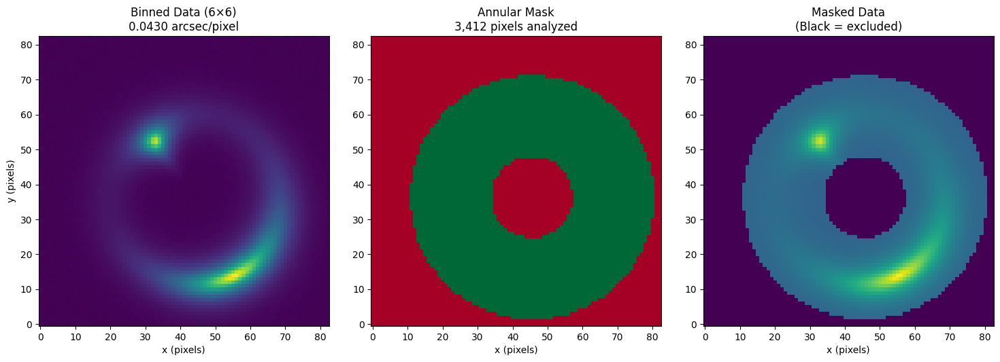


✅ Data prepared for efficient fitting!
   Using 3,412 pixels instead of ~122,540
   This should run ~36× faster!

NOTE: Using 6×6 binning for prototyping efficiency
Final science runs will use native 0.00716 arcsec/pixel
to properly sample HWO's expected ~10-20 mas resolution


In [21]:
# ========================================
# Cell 4: Setup AutoFit Configuration with 6×6 Binning
# ========================================

# Configure AutoFit output paths
run_name = f"module4_proto_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
search_output_path = Path(output_path_prefix) / run_name

print(f"Run name: {run_name}")
print(f"Search output path: {search_output_path}")

# Configure AutoFit settings
settings_autofit = af.SettingsSearch(
    path_prefix=str(search_output_path),
    unique_tag="",  # We'll set this per search
    number_of_cores=1,
    session=None,
)

print("\nAutoFit settings:")
print(f"  - Path prefix: {settings_autofit.path_prefix}")
print(f"  - Number of cores: {settings_autofit.number_of_cores}")

# Apply 6×6 binning to reduce computational load even further
print("\n" + "="*50)
print("APPLYING 6×6 BINNING FOR EFFICIENT PROTOTYPING")
print("="*50)

# Manual binning approach since apply_binning is not available
bin_factor = 6

def bin_array_2d(array, bin_factor):
    """Manually bin a 2D array by averaging bin_factor x bin_factor blocks."""
    shape = array.shape
    new_shape = (shape[0] // bin_factor, shape[1] // bin_factor)
    binned = np.zeros(new_shape)
    
    for i in range(new_shape[0]):
        for j in range(new_shape[1]):
            binned[i, j] = np.mean(array[i*bin_factor:(i+1)*bin_factor, 
                                       j*bin_factor:(j+1)*bin_factor])
    return binned

# Get the native (2D) representations of the data
data_native = imaging.data.native
noise_map_native = imaging.noise_map.native
psf_native = imaging.psf.native

print(f"Original data shape: {data_native.shape}")

# Bin the data and noise map
data_values_binned = bin_array_2d(data_native, bin_factor)
noise_map_values_binned = bin_array_2d(noise_map_native, bin_factor)

print(f"Binned data shape: {data_values_binned.shape}")

# Create Array2D objects with new pixel scale
new_pixel_scale = imaging.pixel_scales[0] * bin_factor

# First create the arrays without mask
data_array = al.Array2D.no_mask(
    values=data_values_binned,
    pixel_scales=new_pixel_scale
)

noise_map_array = al.Array2D.no_mask(
    values=noise_map_values_binned,
    pixel_scales=new_pixel_scale
)

# For PSF, we need to be careful - we should not bin it the same way
# PSF represents the optical response and should remain at its original sampling
# However, we might need to adjust it for the new pixel scale
# For now, let's keep the original PSF
psf_kernel = al.Kernel2D.no_mask(
    values=psf_native,
    pixel_scales=imaging.psf.pixel_scales,
    normalize=True
)

# Create new unmasked imaging with binned data
# Note: We create an unmasked imaging first, then apply mask later
imaging_binned = al.Imaging(
    data=data_array,
    noise_map=noise_map_array,
    psf=psf_kernel,
    pad_for_convolver=False  # Avoid padding issues for now
)

print("✓ Manual binning completed")

print(f"\nOriginal imaging:")
print(f"  - Shape: {imaging.shape_native}")
print(f"  - Pixel scale: {imaging.pixel_scales[0]:.5f} arcsec/pixel")
print(f"  - Total pixels: {imaging.shape_native[0] * imaging.shape_native[1]:,}")

print(f"\nBinned imaging:")
print(f"  - Shape: {imaging_binned.shape_native}")
print(f"  - Pixel scale: {imaging_binned.pixel_scales[0]:.5f} arcsec/pixel")
print(f"  - Total pixels: {imaging_binned.shape_native[0] * imaging_binned.shape_native[1]:,}")
print(f"  - Pixel reduction: {(imaging.shape_native[0] * imaging.shape_native[1]) / (imaging_binned.shape_native[0] * imaging_binned.shape_native[1]):.1f}×")

# Create annular mask for binned data
print("\nCreating annular mask for binned data...")

# Use the same physical parameters as before
lens_center = (0.2, 0.2)  # Your adjusted center
einstein_radius = lensing_data.lens_einstein_radius
inner_radius = 0.5 * einstein_radius
outer_radius = 1.5 * einstein_radius

print(f"Mask parameters (physical units):")
print(f"  - Center: {lens_center} arcsec")
print(f"  - Einstein radius: {einstein_radius:.3f} arcsec")
print(f"  - Inner radius: {inner_radius:.3f} arcsec")
print(f"  - Outer radius: {outer_radius:.3f} arcsec")

# Create the annular mask with the binned shape
mask = al.Mask2D.circular_annular(
    shape_native=imaging_binned.shape_native,
    inner_radius=inner_radius,
    outer_radius=outer_radius,
    centre=lens_center,
    pixel_scales=imaging_binned.pixel_scales,
)

print(f"\nMask created:")
print(f"  - Total pixels in binned image: {mask.shape[0] * mask.shape[1]}")
print(f"  - Unmasked pixels: {mask.pixels_in_mask:,}")
print(f"  - Masked fraction: {1 - mask.pixels_in_mask / (mask.shape[0] * mask.shape[1]):.1%}")

# Calculate actual reduction (original mask had ~122540 pixels)
original_pixels_estimate = imaging.shape_native[0] * imaging.shape_native[1] * 0.49  # ~49% was unmasked
reduction_factor = original_pixels_estimate / mask.pixels_in_mask
print(f"  - Reduction from original: {reduction_factor:.1f}× fewer pixels!")

# Apply mask to binned imaging
imaging_masked = imaging_binned.apply_mask(mask=mask)

# Visualization
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Binned data
axes[0].imshow(imaging_binned.data.native, origin='lower', cmap='viridis')
axes[0].set_title(f'Binned Data (6×6)\n{imaging_binned.pixel_scales[0]:.4f} arcsec/pixel')
axes[0].set_xlabel('x (pixels)')
axes[0].set_ylabel('y (pixels)')

# The mask
axes[1].imshow(~mask, origin='lower', cmap='RdYlGn')
axes[1].set_title(f'Annular Mask\n{mask.pixels_in_mask:,} pixels analyzed')
axes[1].set_xlabel('x (pixels)')

# Masked data
masked_display = imaging_binned.data.native.copy()
masked_display[mask] = 0
axes[2].imshow(masked_display, origin='lower', cmap='viridis')
axes[2].set_title('Masked Data\n(Black = excluded)')
axes[2].set_xlabel('x (pixels)')

plt.tight_layout()
plt.show()

print("\n✅ Data prepared for efficient fitting!")
print(f"   Using {mask.pixels_in_mask:,} pixels instead of ~122,540")
print(f"   This should run ~{reduction_factor:.0f}× faster!")

# Note for documentation
print("\n" + "="*50)
print("NOTE: Using 6×6 binning for prototyping efficiency")
print(f"Final science runs will use native {imaging.pixel_scales[0]:.5f} arcsec/pixel")
print("to properly sample HWO's expected ~10-20 mas resolution")
print("="*50)

In [25]:
# ========================================
# Cell 5: Create Informed Lens Model (No Subhalo)
# ========================================

print("Creating informed lens model without subhalo...")

# Extract truth values from lensing data
# Try different ways to access the mass profile depending on PyAutoLens version
true_lens_mass = None
true_shear = None

# Method 1: Direct attribute access
if hasattr(lens_galaxy, 'mass'):
    true_lens_mass = lens_galaxy.mass
    print("Found mass profile via direct attribute")
elif hasattr(lens_galaxy, 'sis'):
    true_lens_mass = lens_galaxy.sis
    print("Found SIS mass profile")
elif hasattr(lens_galaxy, 'isothermal'):
    true_lens_mass = lens_galaxy.isothermal
    print("Found isothermal mass profile")
    
# Look for shear
if hasattr(lens_galaxy, 'shear'):
    true_shear = lens_galaxy.shear
    print("Found shear profile")

# If we still don't have the mass profile, try to find it
if true_lens_mass is None:
    print("\nSearching for mass profile in galaxy attributes...")
    for attr_name in dir(lens_galaxy):
        if not attr_name.startswith('_'):
            attr = getattr(lens_galaxy, attr_name)
            if hasattr(attr, 'einstein_radius'):
                true_lens_mass = attr
                print(f"Found mass profile as: {attr_name}")
                break

if true_lens_mass is None:
    raise ValueError("Could not find mass profile in lens galaxy")

print("\nTrue lens parameters:")
print(f"  - Mass profile type: {type(true_lens_mass).__name__}")
if hasattr(true_lens_mass, 'einstein_radius'):
    print(f"  - Einstein radius: {true_lens_mass.einstein_radius:.3f}")
if hasattr(true_lens_mass, 'centre'):
    print(f"  - Centre: ({true_lens_mass.centre[0]:.3f}, {true_lens_mass.centre[1]:.3f})")
if hasattr(true_lens_mass, 'ell_comps'):
    print(f"  - Elliptical components: ({true_lens_mass.ell_comps[0]:.3f}, {true_lens_mass.ell_comps[1]:.3f})")

# Create lens mass model with informed priors
if 'Isothermal' in type(true_lens_mass).__name__:
    lens_mass_model = af.Model(al.mp.Isothermal)
    # Set informed priors (truth ± 10%)
    lens_mass_model.centre.centre_0 = af.GaussianPrior(
        mean=true_lens_mass.centre[0], 
        sigma=0.05
    )
    lens_mass_model.centre.centre_1 = af.GaussianPrior(
        mean=true_lens_mass.centre[1], 
        sigma=0.05
    )
    lens_mass_model.einstein_radius = af.GaussianPrior(
        mean=true_lens_mass.einstein_radius,
        sigma=0.1 * true_lens_mass.einstein_radius
    )
    # Use ell_comps not elliptical_comps
    lens_mass_model.ell_comps.ell_comps_0 = af.GaussianPrior(
        mean=true_lens_mass.ell_comps[0],
        sigma=0.05
    )
    lens_mass_model.ell_comps.ell_comps_1 = af.GaussianPrior(
        mean=true_lens_mass.ell_comps[1],
        sigma=0.05
    )
else:
    raise ValueError(f"Unsupported mass profile type: {type(true_lens_mass).__name__}")

# Create shear model if present
if true_shear is not None:
    shear_model = af.Model(al.mp.ExternalShear)
    shear_model.gamma_1 = af.GaussianPrior(
        mean=true_shear.gamma_1,
        sigma=0.01
    )
    shear_model.gamma_2 = af.GaussianPrior(
        mean=true_shear.gamma_2,
        sigma=0.01
    )
    print(f"\nTrue shear: ({true_shear.gamma_1:.3f}, {true_shear.gamma_2:.3f})")
else:
    shear_model = None

# Create simple source model - using Sersic for parametric fitting
source_model = af.Model(al.lp.Sersic)

print("\nModel components created:")
print(f"  - Lens mass: {lens_mass_model}")
print(f"  - Shear: {shear_model}")
print(f"  - Source: {source_model}")

Creating informed lens model without subhalo...
Found mass profile via direct attribute

True lens parameters:
  - Mass profile type: Isothermal
  - Einstein radius: 1.000
  - Centre: (0.000, 0.000)
  - Elliptical components: (0.100, 0.000)

Model components created:
  - Lens mass: Isothermal (centre_0, GaussianPrior [90], mean = 0.0, sigma = 0.05), (centre_1, GaussianPrior [91], mean = 0.0, sigma = 0.05), (ell_comps_0, GaussianPrior [93], mean = 0.1, sigma = 0.05), (ell_comps_1, GaussianPrior [94], mean = 0.0, sigma = 0.05), (einstein_radius, GaussianPrior [92], mean = 1, sigma = 0.1)
  - Shear: None
  - Source: Sersic (centre_0, GaussianPrior [95], mean = 0.0, sigma = 0.3), (centre_1, GaussianPrior [96], mean = 0.0, sigma = 0.3), (ell_comps_0, GaussianPrior [97], mean = 0.0, sigma = 0.3), (ell_comps_1, GaussianPrior [98], mean = 0.0, sigma = 0.3), (intensity, LogUniformPrior [99], lower_limit = 1e-06, upper_limit = 1000000.0), (effective_radius, UniformPrior [100], lower_limit = 0.0,

Fitting null model (no subhalo) using Nautilus...

Search configuration:
  - Method: Nautilus (memory efficient)
  - Number of free parameters: 12
  - Live points: 50
  - Cores: 2 (KEEP AT 1!)
  - Unmasked pixels: 3,412

Estimated run time: 6-11 minutes

Starting fit...
2025-07-30 13:10:29,628 - autofit.non_linear.search.abstract_search - INFO - Starting non-linear search with 2 cores.
2025-07-30 13:10:29,685 - null_model_nautilus - INFO - The output path of this fit is /Users/vassilak/research/hwo/outputs/proto/module4_proto_20250730_130504/no_subhalo/null_model_nautilus/0a6ed8c8bbb7d18686d825e1dde080a2
2025-07-30 13:10:29,685 - null_model_nautilus - INFO - Outputting pre-fit files (e.g. model.info, visualization).
2025-07-30 13:10:31,457 - null_model_nautilus - INFO - Resuming Nautilus non-linear search (previous samples found).
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_ef

<Figure size 1200x1200 with 0 Axes>

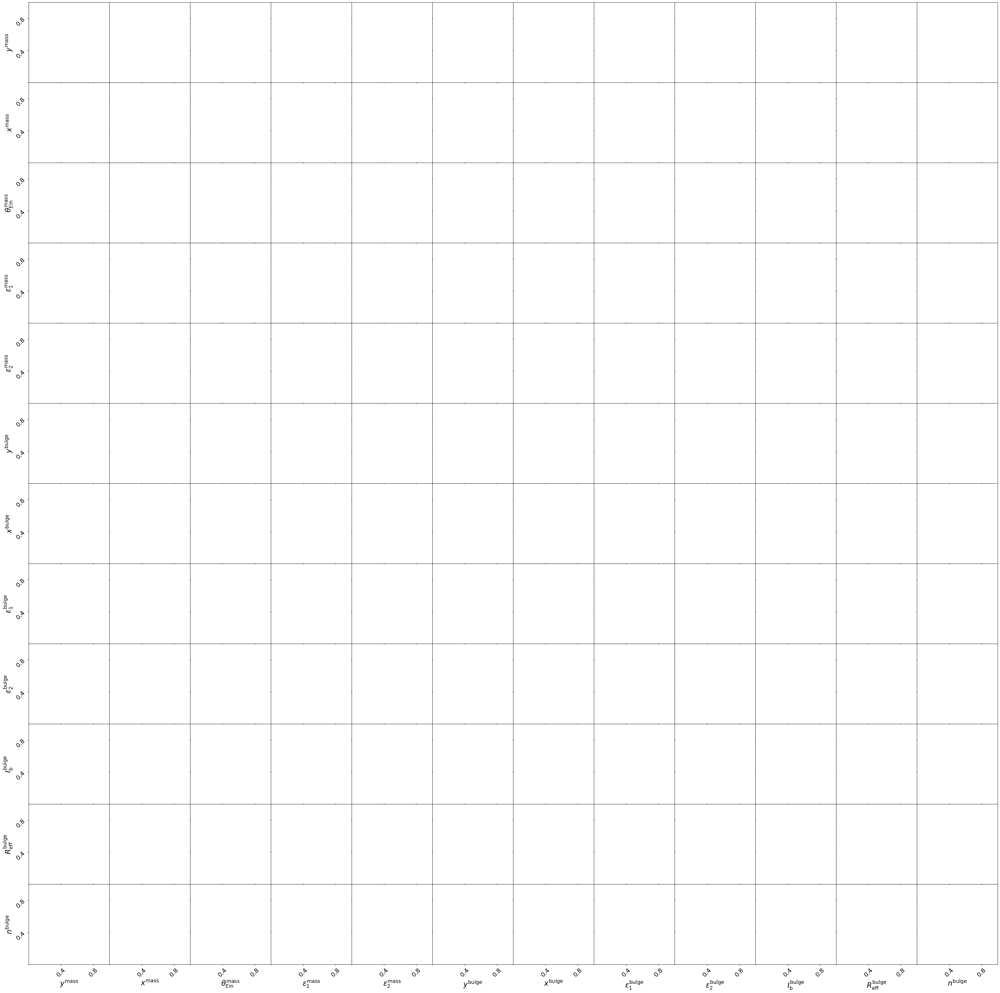

<Figure size 1200x1200 with 0 Axes>

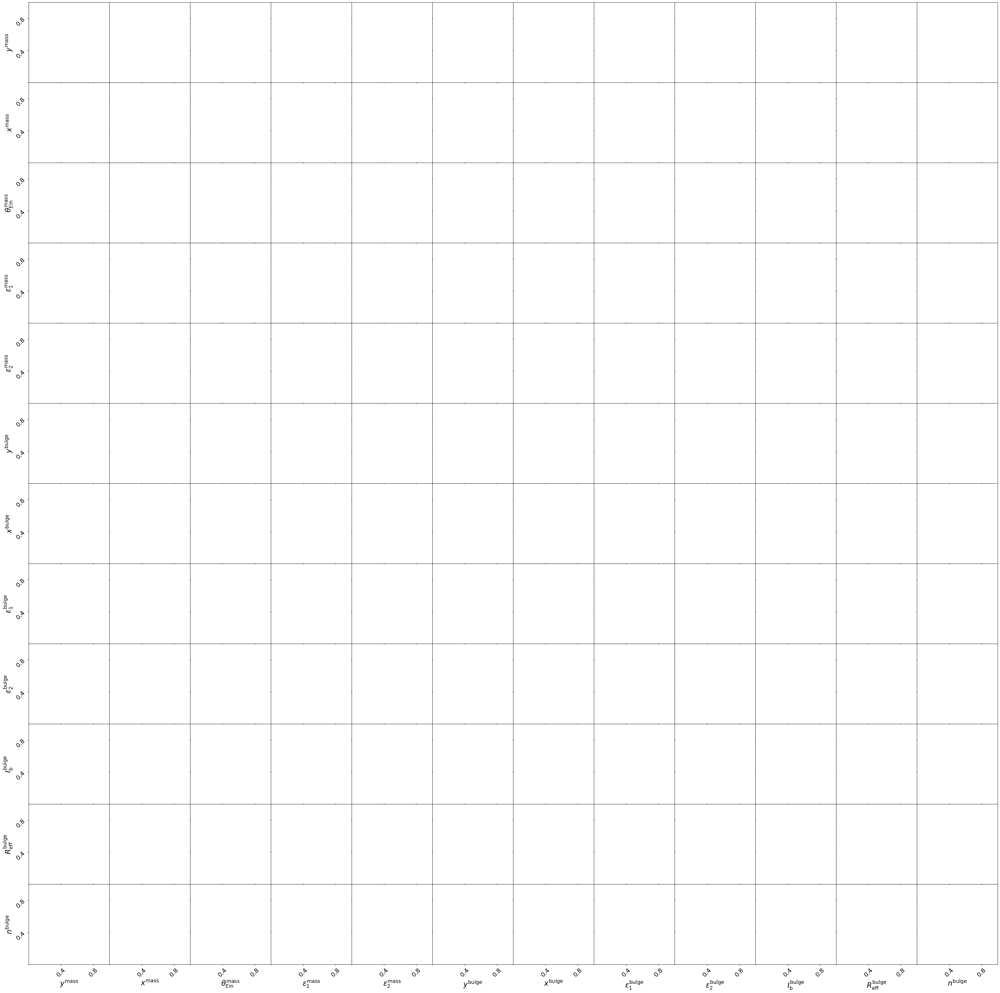

<Figure size 1200x1200 with 0 Axes>

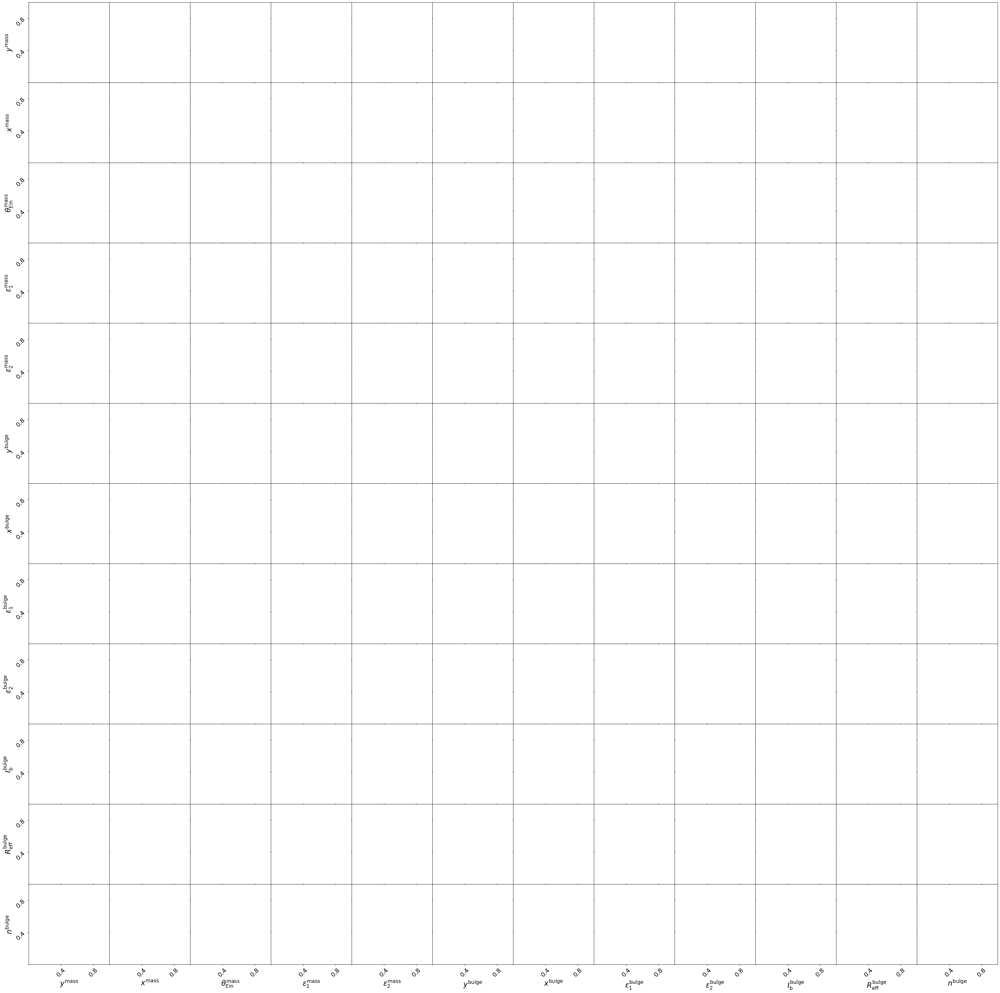

<Figure size 1200x1200 with 0 Axes>

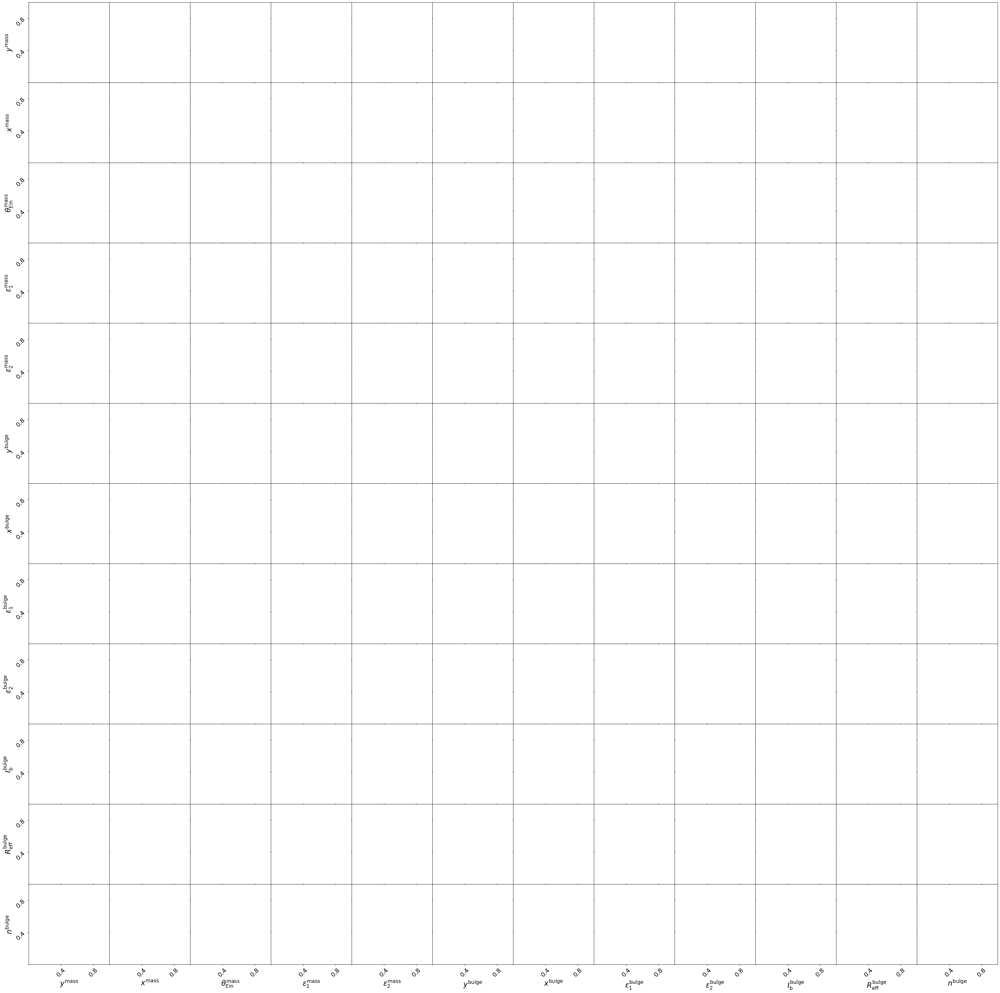

<Figure size 1200x1200 with 0 Axes>

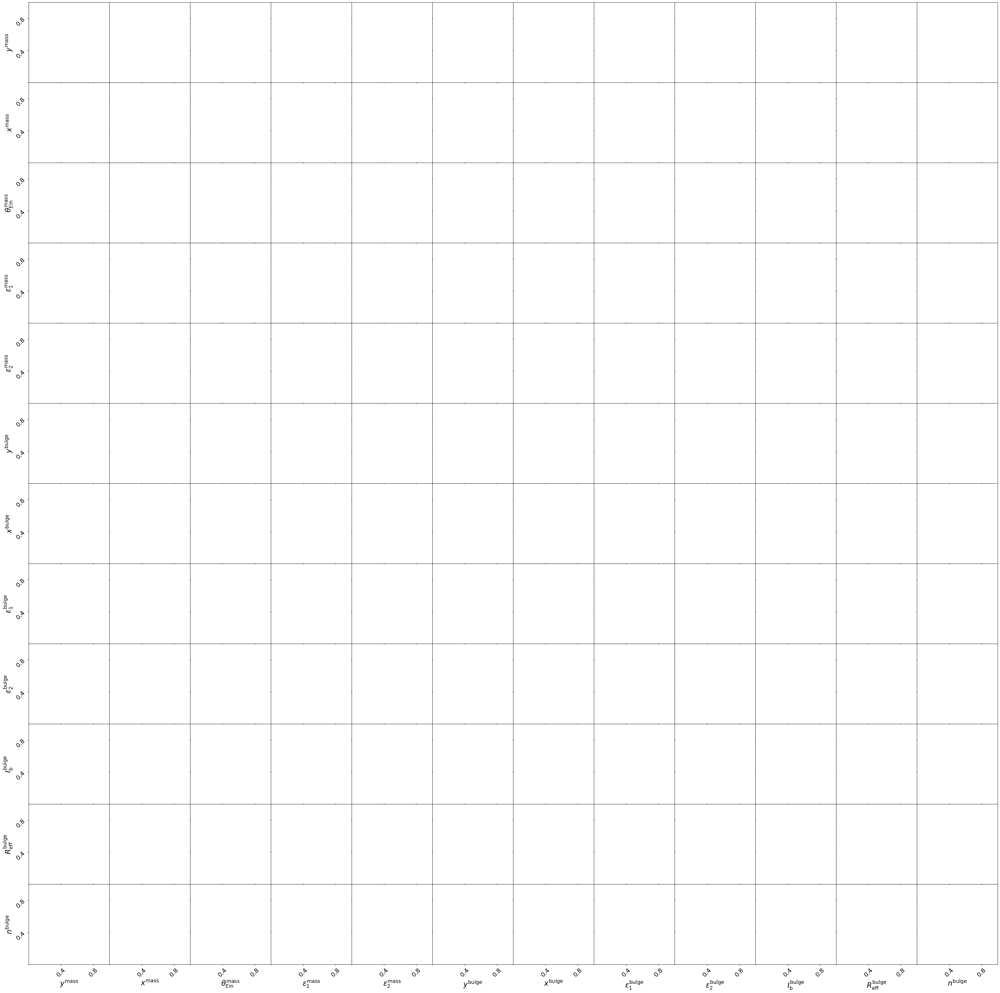

<Figure size 1200x1200 with 0 Axes>

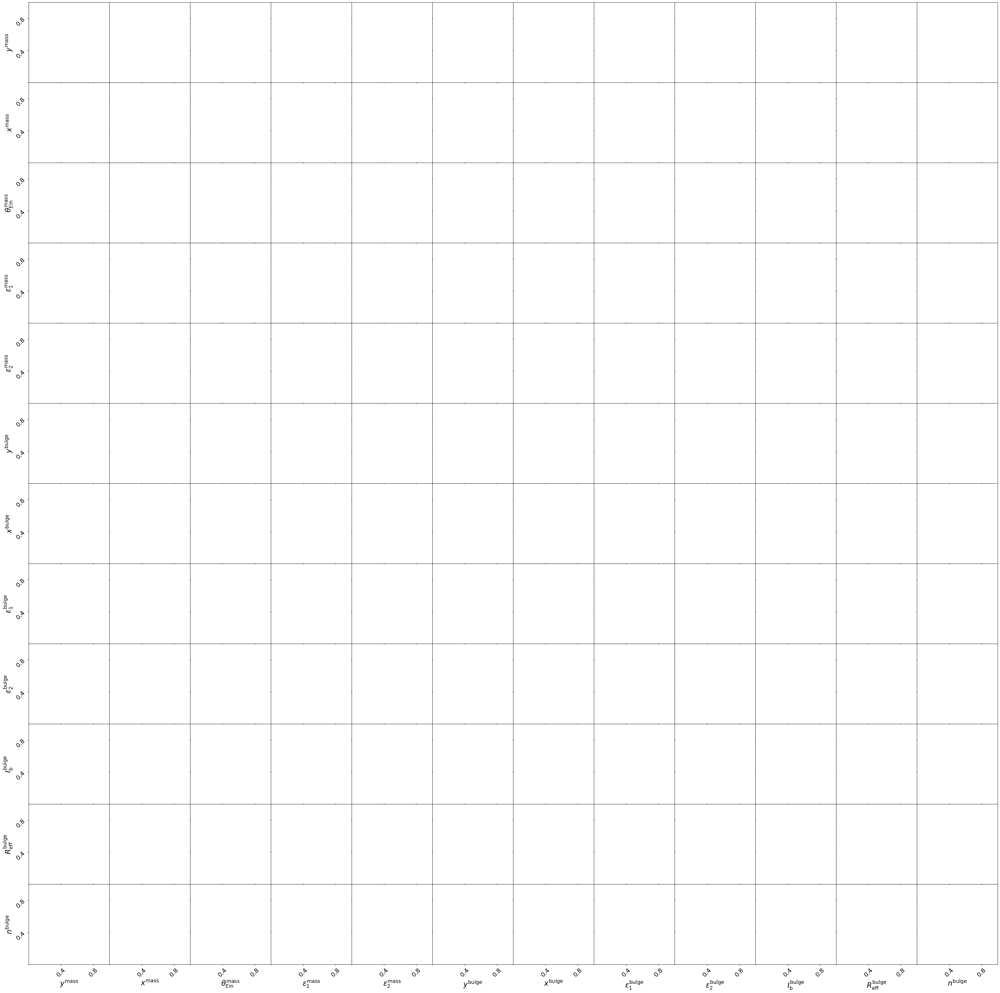

<Figure size 1200x1200 with 0 Axes>

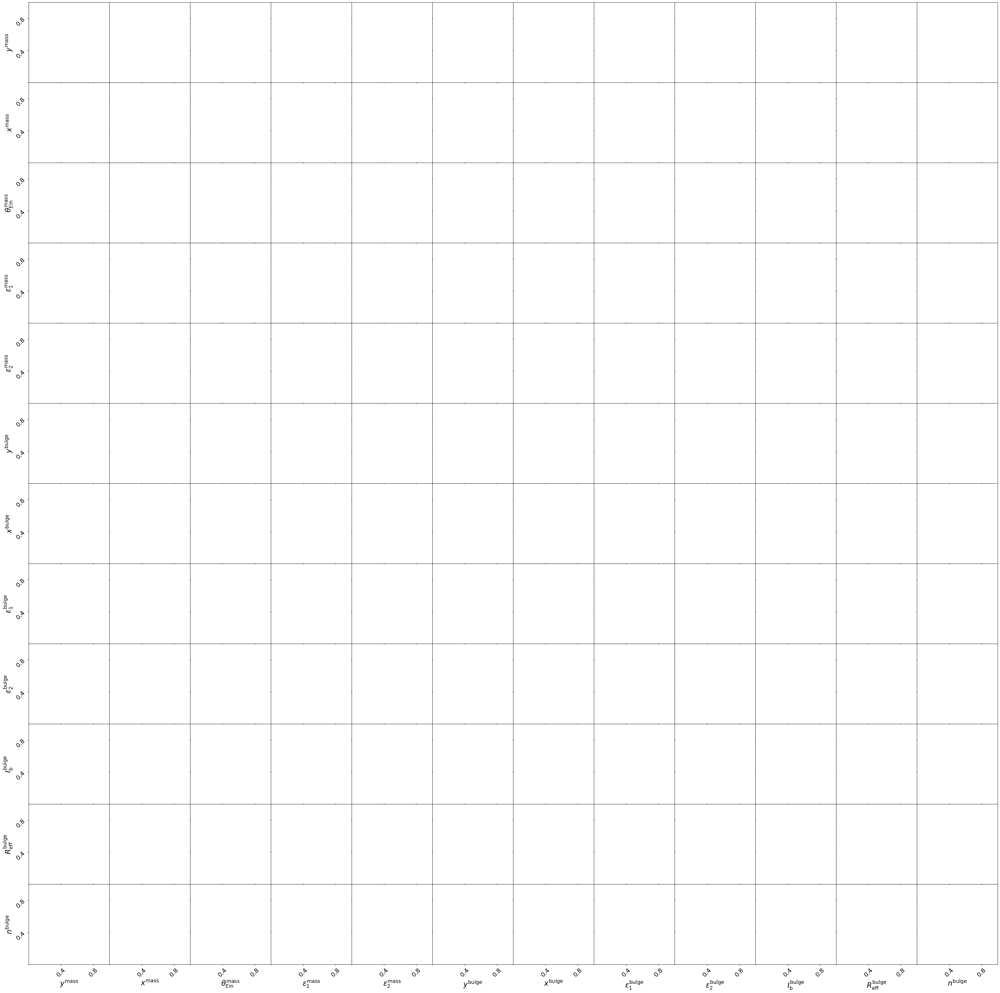

<Figure size 1200x1200 with 0 Axes>

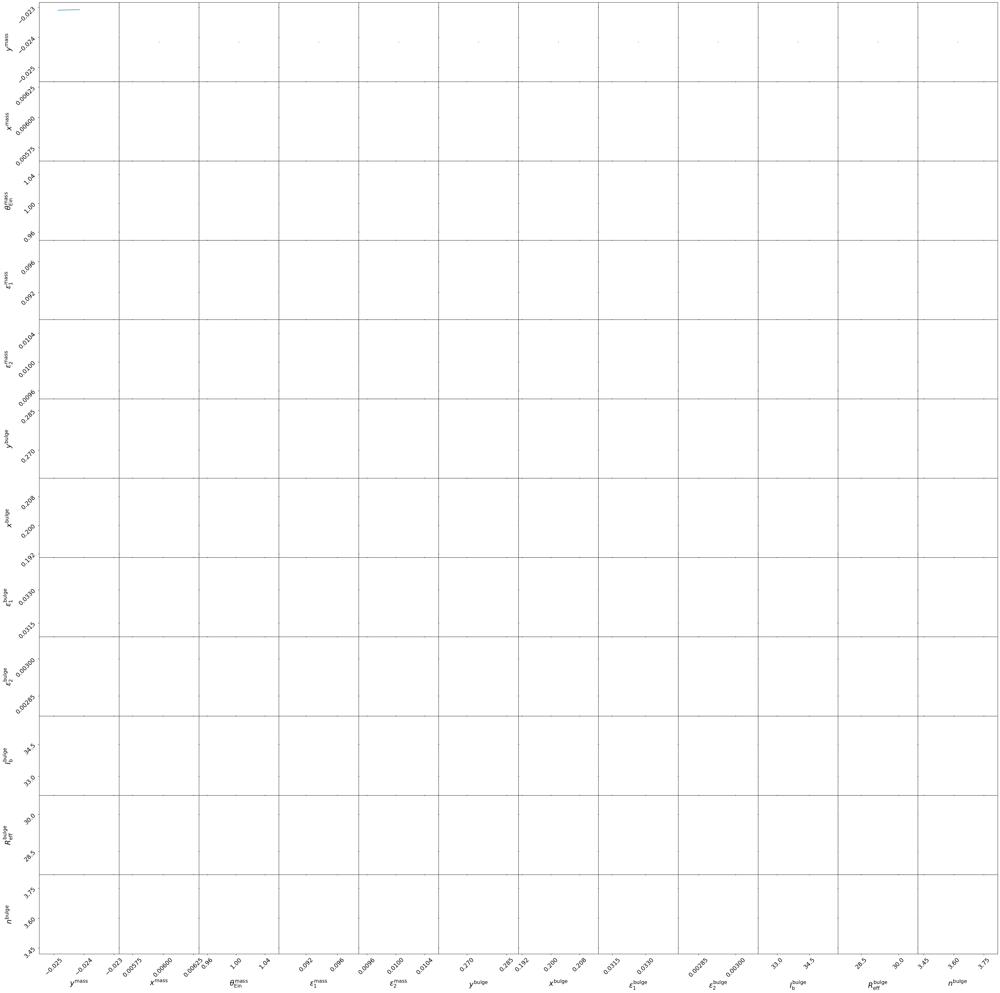

<Figure size 1200x1200 with 0 Axes>

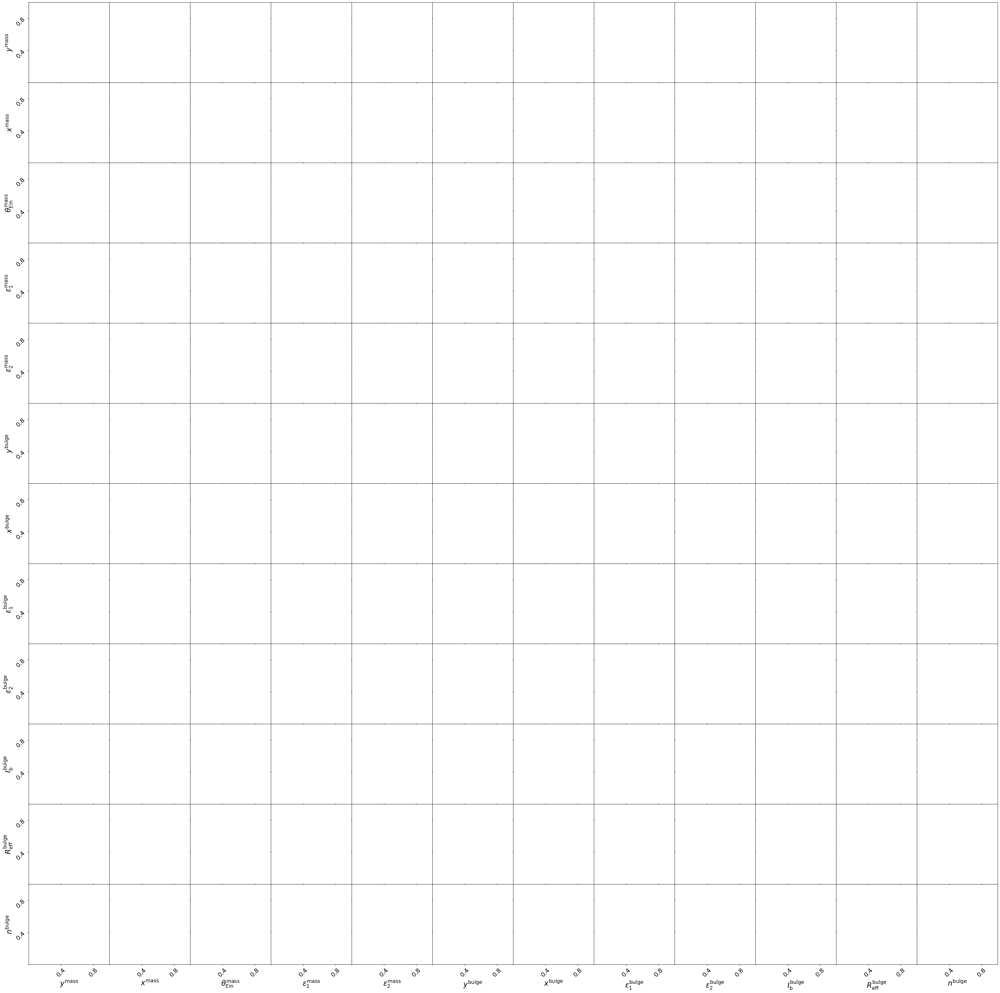

<Figure size 1200x1200 with 0 Axes>

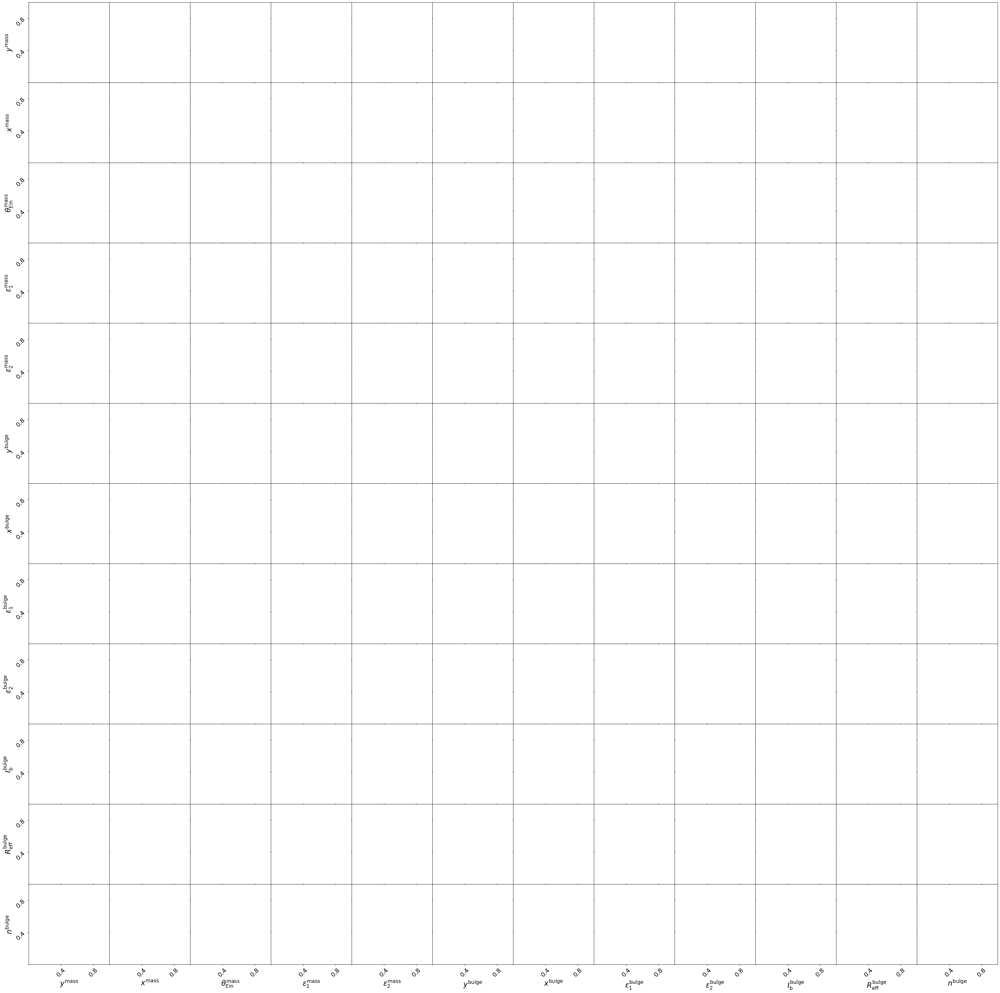

<Figure size 1200x1200 with 0 Axes>

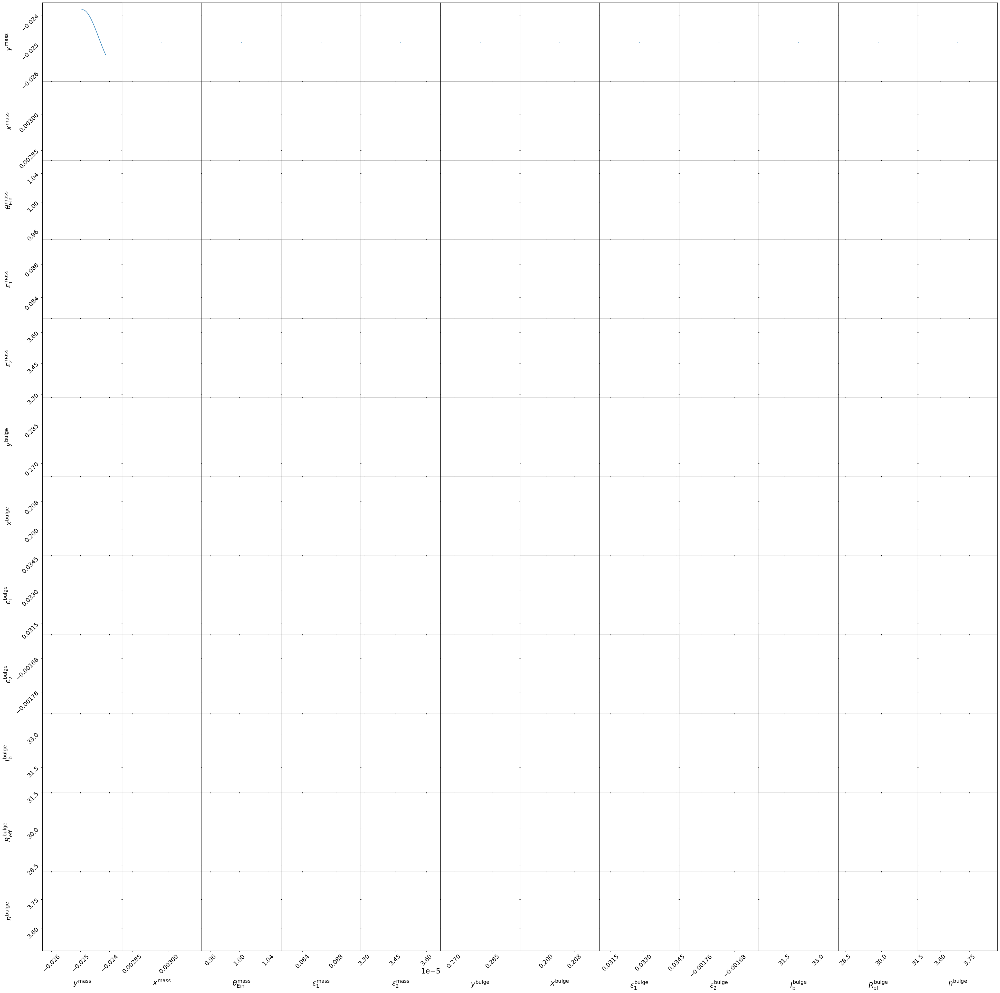

<Figure size 1200x1200 with 0 Axes>

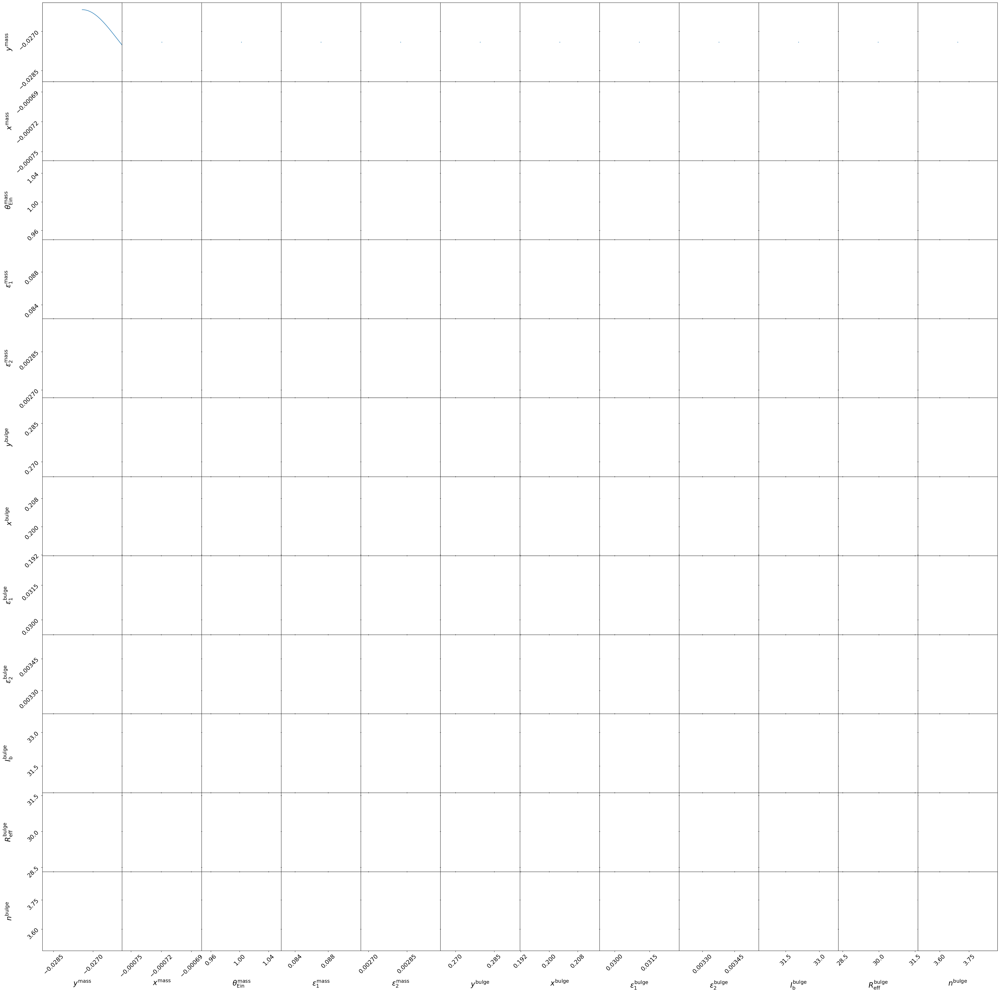

<Figure size 1200x1200 with 0 Axes>

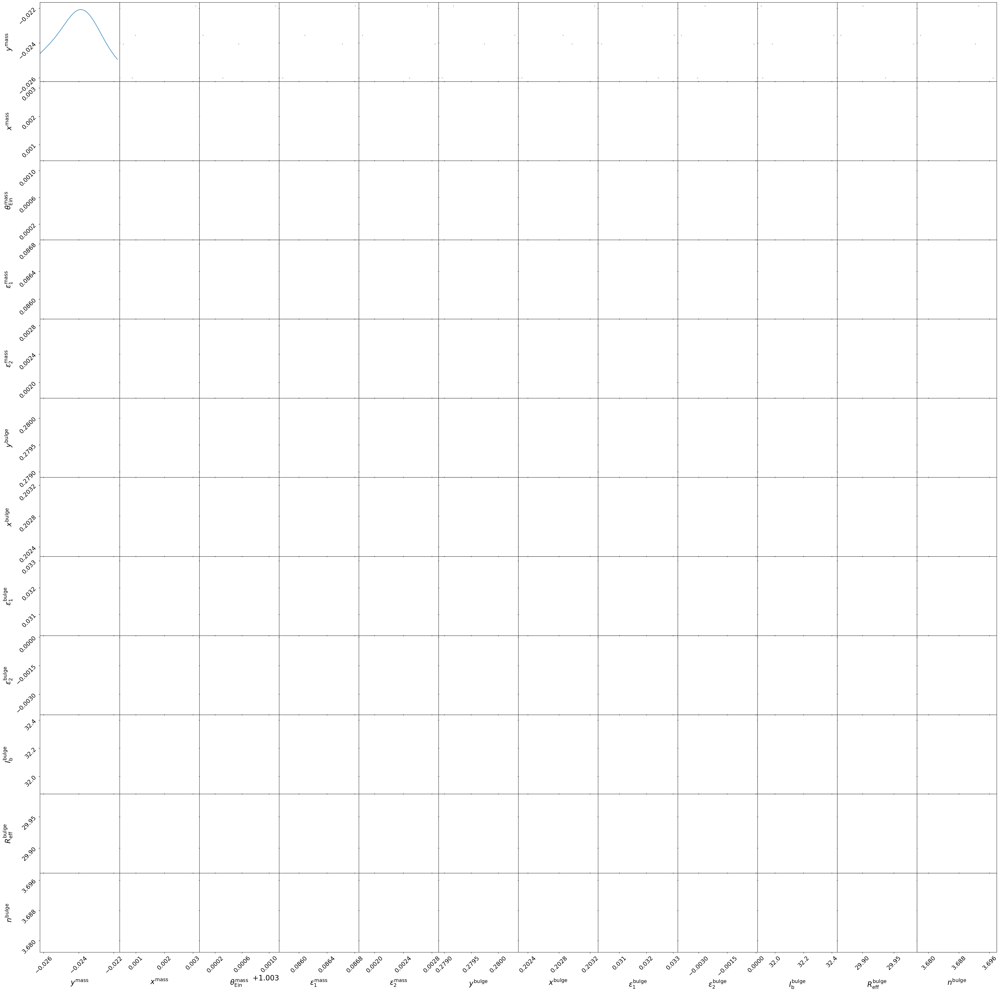

<Figure size 1200x1200 with 0 Axes>

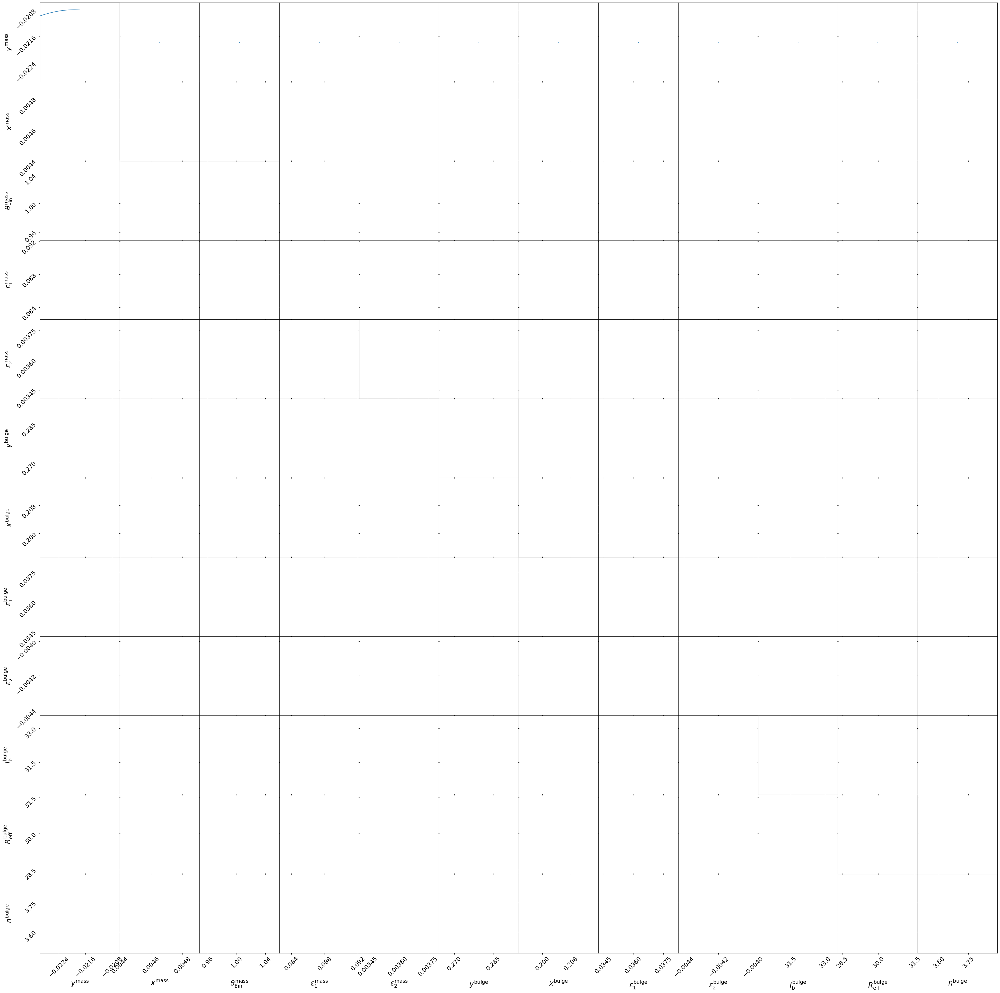

<Figure size 1200x1200 with 0 Axes>

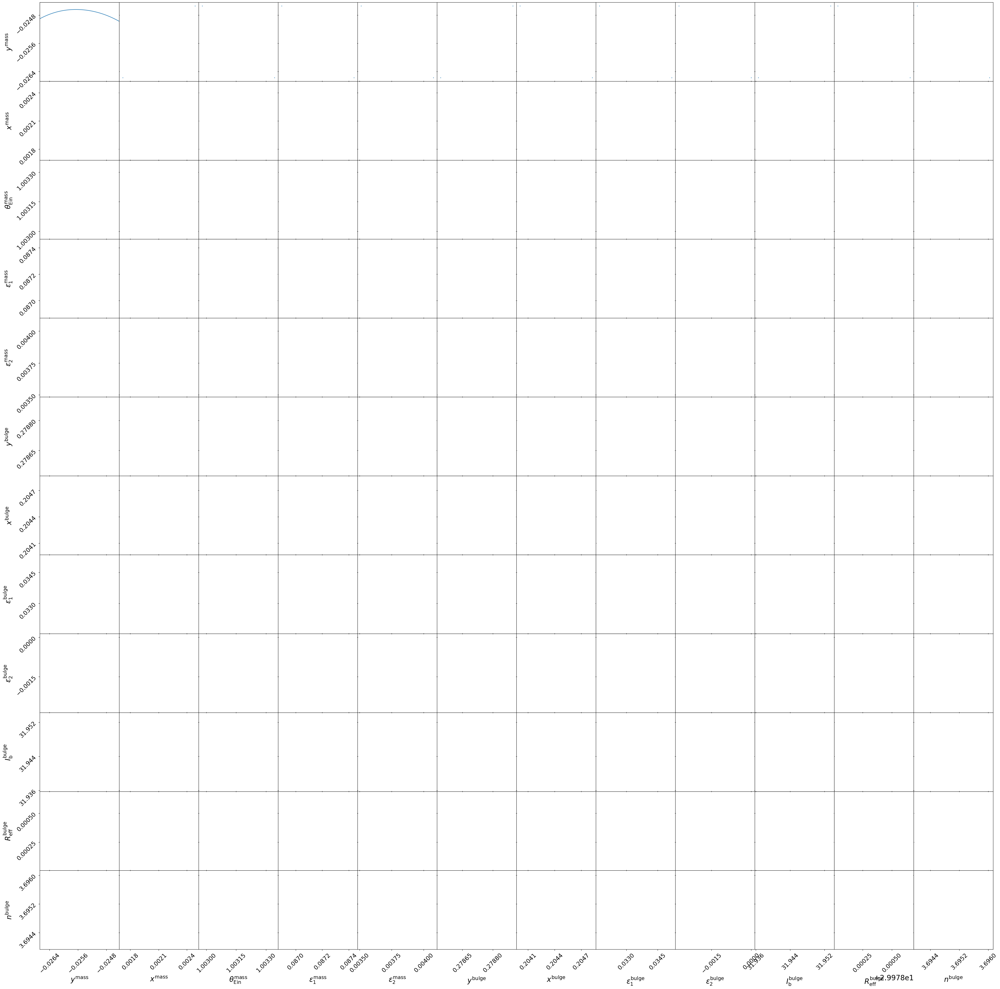

<Figure size 1200x1200 with 0 Axes>

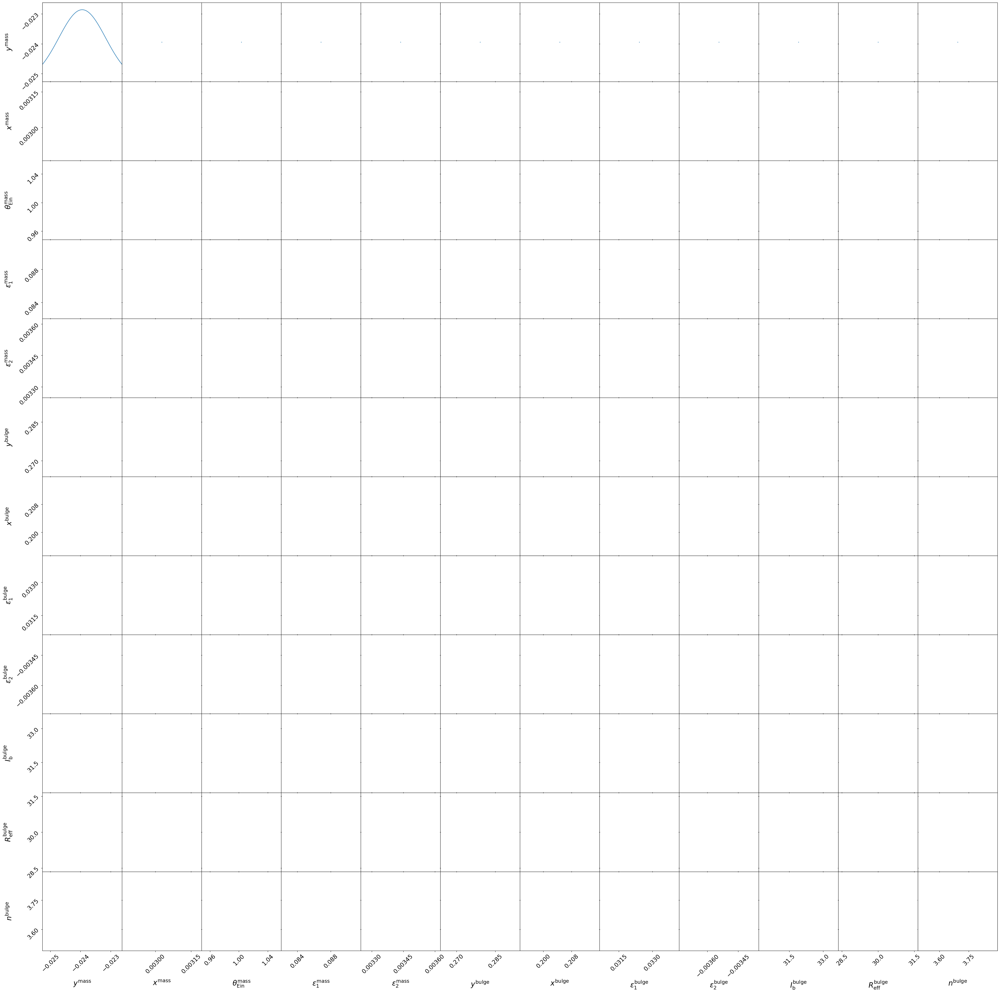

<Figure size 1200x1200 with 0 Axes>

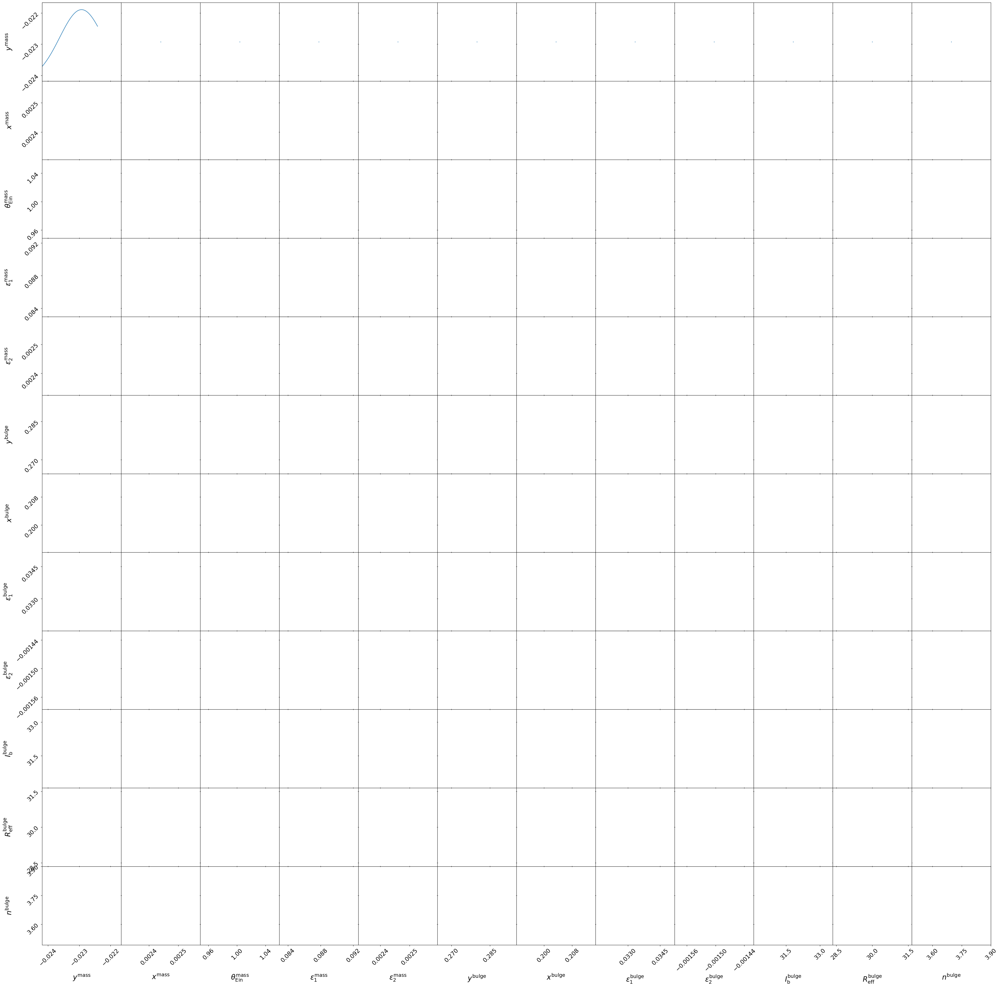

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

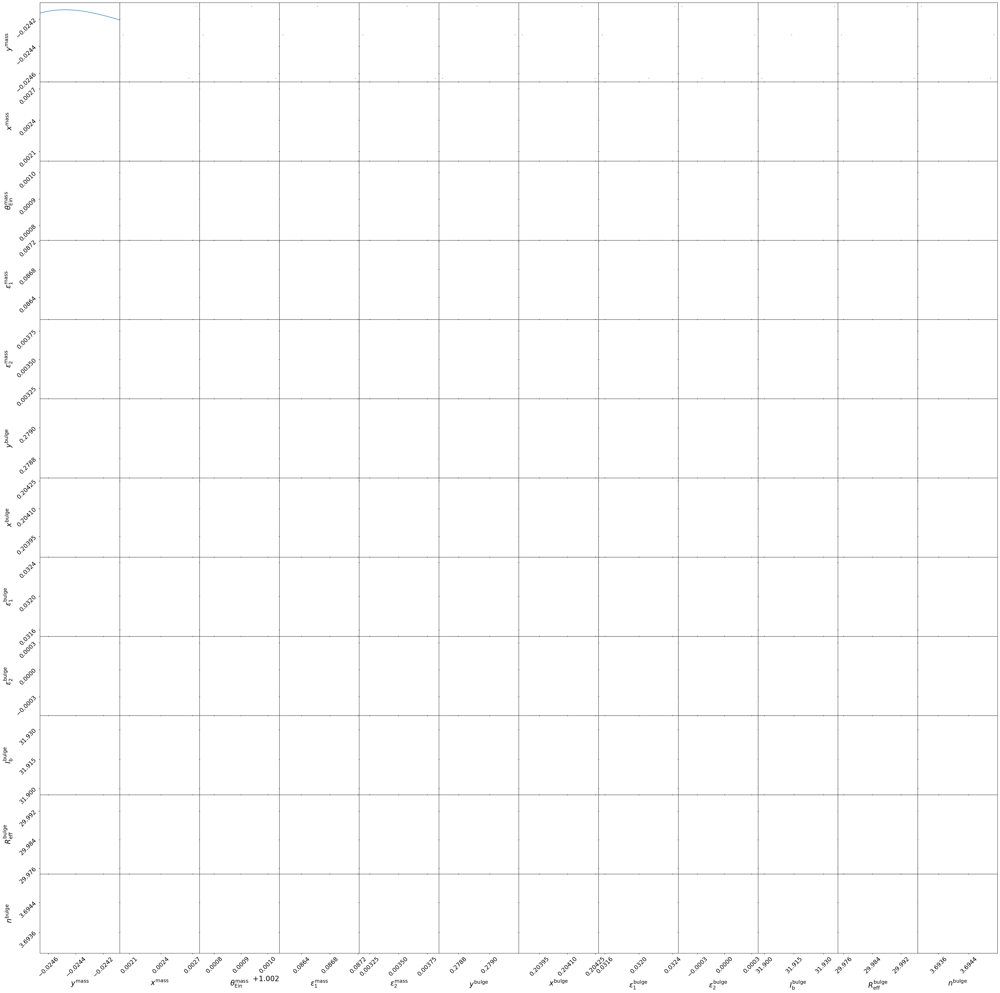

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

In [26]:
# ========================================
# Cell 6: Fit Null Model (No Subhalo) with Nautilus
# ========================================

print("Fitting null model (no subhalo) using Nautilus...")

# Create the lens galaxy model
lens_galaxy_null = af.Model(
    al.Galaxy,
    redshift=lensing_data.lens_redshift,
    mass=lens_mass_model,
    shear=shear_model,
)

# Create the source galaxy model
source_galaxy_null = af.Model(
    al.Galaxy,
    redshift=lensing_data.source_redshift,
    bulge=source_model,
)

# Combine into full model
model_null = af.Collection(
    galaxies=af.Collection(
        lens=lens_galaxy_null,
        source=source_galaxy_null,
    )
)

# Create analysis with settings to reduce memory usage
analysis_null = al.AnalysisImaging(
    dataset=imaging_masked,
    settings_inversion=al.SettingsInversion(
        use_positive_only_solver=True,  # More memory efficient
        use_w_tilde=False,  # Disable w-tilde formalism
    )
)

# Configure Nautilus search
search_null = af.Nautilus(
    path_prefix=str(search_output_path),
    name="null_model_nautilus",
    unique_tag="no_subhalo",
    n_live=50,  # Low for fast prototyping
    number_of_cores=2,  # ALWAYS 1 for safety
)

print("\nSearch configuration:")
print(f"  - Method: Nautilus (memory efficient)")
print(f"  - Number of free parameters: {model_null.total_free_parameters}")
print(f"  - Live points: {search_null.n_live}")
print(f"  - Cores: {search_null.number_of_cores} (KEEP AT 1!)")
print(f"  - Unmasked pixels: {imaging_masked.mask.pixels_in_mask:,}")

# Estimate run time
pixels_per_second = 10  # Conservative estimate
estimated_minutes = (imaging_masked.mask.pixels_in_mask / pixels_per_second) / 60
print(f"\nEstimated run time: {estimated_minutes:.0f}-{estimated_minutes*2:.0f} minutes")

# Clear memory before starting
import gc
gc.collect()

# Perform the fit
print("\nStarting fit...")
start_time = datetime.now()

try:
    result_null = search_null.fit(model=model_null, analysis=analysis_null)
    fit_time_null = (datetime.now() - start_time).total_seconds()
    
    print(f"\n✅ Null model fit completed successfully!")
    print(f"   Time taken: {fit_time_null/60:.1f} minutes")
    
except Exception as e:
    print(f"\n❌ Error during fitting: {e}")
    print("Suggestions:")
    print("  1. Try reducing n_live to 25")
    print("  2. Check if mask is capturing the lensed features")
    print("  3. Ensure priors are reasonable")
    raise

Analyzing null model results...
Log evidence: -52072.53

Best-fit null model parameters:
  - Einstein radius: 1.003
  - Centre: (-0.024, 0.003)
  - Ellipticity: (0.087, 0.003)

✅ Results saved to null_model_summary.json


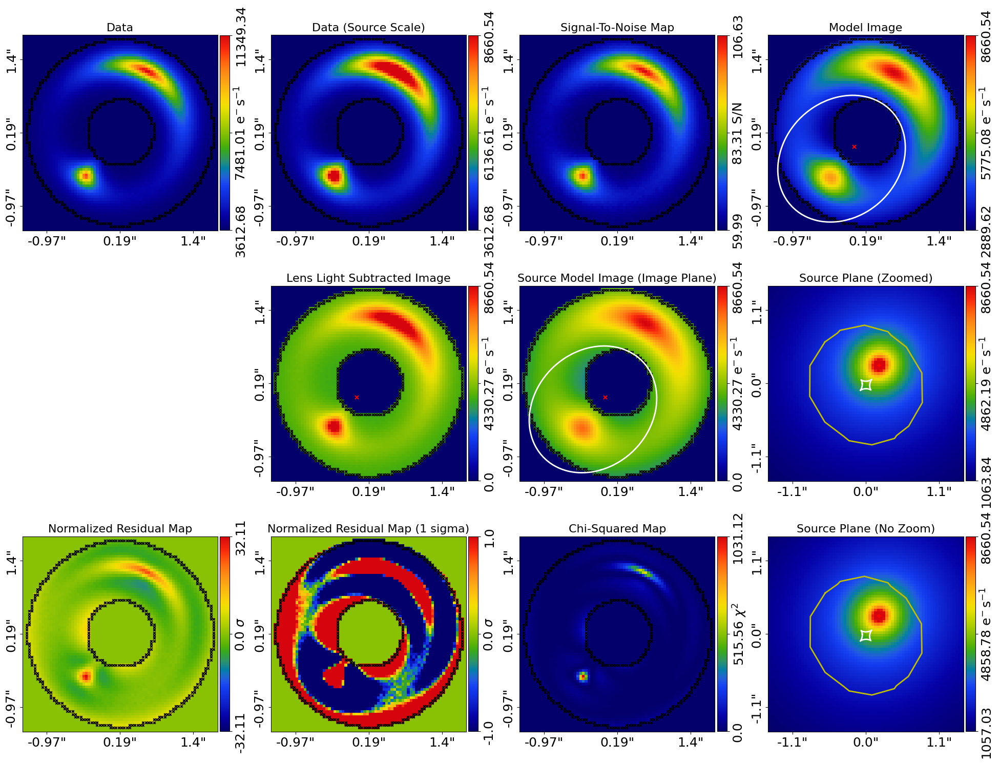

✅ Fit visualization saved to null_model_fit.png


<Figure size 640x480 with 0 Axes>

In [30]:
# ========================================
# Cell 6b: Analyze and Visualize Null Model Results
# ========================================

print("Analyzing null model results...")

# Check if result_null exists
if 'result_null' not in locals():
    raise ValueError("result_null not found! Run Cell 6 first.")

# Extract fit information
print(f"Log evidence: {result_null.samples.log_evidence:.2f}")

# Get max log likelihood - it's a method that needs to be called
try:
    max_ll = result_null.samples.max_log_likelihood()
    print(f"Max log likelihood: {max_ll:.2f}")
except Exception as e:
    print(f"Warning: Could not get max_log_likelihood: {e}")
    max_ll = None

# Extract best-fit parameters
best_fit_null = result_null.max_log_likelihood_instance
print("\nBest-fit null model parameters:")
print(f"  - Einstein radius: {best_fit_null.galaxies.lens.mass.einstein_radius:.3f}")
print(f"  - Centre: ({best_fit_null.galaxies.lens.mass.centre[0]:.3f}, {best_fit_null.galaxies.lens.mass.centre[1]:.3f})")
print(f"  - Ellipticity: ({best_fit_null.galaxies.lens.mass.ell_comps[0]:.3f}, {best_fit_null.galaxies.lens.mass.ell_comps[1]:.3f})")

# Save key results to avoid losing them
null_results_summary = {
    'log_evidence': float(result_null.samples.log_evidence),
    'max_log_likelihood': float(max_ll) if max_ll is not None else None,
    'einstein_radius': float(best_fit_null.galaxies.lens.mass.einstein_radius),
    'centre_0': float(best_fit_null.galaxies.lens.mass.centre[0]),
    'centre_1': float(best_fit_null.galaxies.lens.mass.centre[1]),
    'ell_comps_0': float(best_fit_null.galaxies.lens.mass.ell_comps[0]),
    'ell_comps_1': float(best_fit_null.galaxies.lens.mass.ell_comps[1]),
    'fit_time_seconds': float(fit_time_null) if 'fit_time_null' in locals() else None
}

# If shear was included, save it too
if hasattr(best_fit_null.galaxies.lens, 'shear') and best_fit_null.galaxies.lens.shear is not None:
    null_results_summary['shear_gamma_1'] = float(best_fit_null.galaxies.lens.shear.gamma_1)
    null_results_summary['shear_gamma_2'] = float(best_fit_null.galaxies.lens.shear.gamma_2)
    print(f"  - Shear: ({best_fit_null.galaxies.lens.shear.gamma_1:.3f}, {best_fit_null.galaxies.lens.shear.gamma_2:.3f})")

# Save to file for safety
with open(search_output_path / 'null_model_summary.json', 'w') as f:
    json.dump(null_results_summary, f, indent=2)
print("\n✅ Results saved to null_model_summary.json")

# Quick visualization of the fit (optional - can skip if imports are missing)
try:
    import autolens.plot as aplt
    fit_plotter = aplt.FitImagingPlotter(fit=result_null.max_log_likelihood_fit)
    fit_plotter.subplot_fit()
    plt.savefig(search_output_path / 'null_model_fit.png', dpi=150)
    print("✅ Fit visualization saved to null_model_fit.png")
except Exception as e:
    print(f"⚠️ Warning: Could not create fit visualization: {e}")
    print("   Results are still saved, continuing...")

In [34]:
# ========================================
# Cell 7: Create Subhalo Model
# ========================================

print("Creating subhalo model...")

# Get true subhalo parameters
if lensing_data.has_subhalo:
    true_subhalo_mass = lensing_data.subhalo_mass
    true_subhalo_pos = lensing_data.subhalo_position
    print(f"\nTrue subhalo parameters:")
    print(f"  - Mass: {true_subhalo_mass:.2e} M_sun")
    print(f"  - Position: ({true_subhalo_pos[0]:.3f}, {true_subhalo_pos[1]:.3f})")
else:
    # For testing, inject a fake subhalo
    true_subhalo_mass = 1e7
    true_subhalo_pos = (0.5, 0.5)
    print("\nNo subhalo in data - using test values")

# Create subhalo model with informed priors
subhalo_model = af.Model(al.mp.NFWMCRLudlow)

# Position priors: truth ± 0.05 arcsec
subhalo_model.centre.centre_0 = af.UniformPrior(
    lower_limit=true_subhalo_pos[0] - 0.05,
    upper_limit=true_subhalo_pos[0] + 0.05
)
subhalo_model.centre.centre_1 = af.UniformPrior(
    lower_limit=true_subhalo_pos[1] - 0.05,
    upper_limit=true_subhalo_pos[1] + 0.05
)

# Mass prior: log-uniform around true mass (factor of 2)
subhalo_model.mass_at_200 = af.LogUniformPrior(
    lower_limit=true_subhalo_mass / 2.0,
    upper_limit=true_subhalo_mass * 2.0
)

# Set redshifts
subhalo_model.redshift_object = lensing_data.lens_redshift
subhalo_model.redshift_source = lensing_data.source_redshift

print("\nSubhalo model priors:")
print(f"  - Centre_0: [{true_subhalo_pos[0] - 0.05:.3f}, {true_subhalo_pos[0] + 0.05:.3f}]")
print(f"  - Centre_1: [{true_subhalo_pos[1] - 0.05:.3f}, {true_subhalo_pos[1] + 0.05:.3f}]")
print(f"  - log10(M200): [{np.log10(true_subhalo_mass/2):.2f}, {np.log10(true_subhalo_mass*2):.2f}]")

# Also test null positions for false positive rate
null_positions = [
    (-0.8, 0.0),  # Opposite side of lens
    (0.0, 0.8),   # 90 degrees from subhalo
]
print(f"\nNull test positions: {null_positions}")

Creating subhalo model...

True subhalo parameters:
  - Mass: 1.00e+07 M_sun
  - Position: (-0.593, 0.744)

Subhalo model priors:
  - Centre_0: [-0.643, -0.543]
  - Centre_1: [0.694, 0.794]
  - log10(M200): [6.70, 7.30]

Null test positions: [(-0.8, 0.0), (0.0, 0.8)]


Fitting model with subhalo...

Starting subhalo model fit...
  - Number of free parameters: 10
  - Fixed components: lens mass, shear, source
  - Free parameters: subhalo (x, y, M200)
2025-07-30 14:35:36,699 - autofit.non_linear.search.abstract_search - INFO - Starting non-linear search with 3 cores.
2025-07-30 14:35:36,760 - subhalo_model_nautilus - INFO - The output path of this fit is /Users/vassilak/research/hwo/outputs/proto/module4_proto_20250730_130504/with_subhalo/subhalo_model_nautilus/c73d7a98ff84e54982acdfb3435f93a2
2025-07-30 14:35:36,761 - subhalo_model_nautilus - INFO - Outputting pre-fit files (e.g. model.info, visualization).
2025-07-30 14:35:39,078 - subhalo_model_nautilus - INFO - Starting new Nautilus non-linear search (no previous samples found).
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Stopped   | 3      | 1        | 4        | 500      

<Figure size 1200x1200 with 0 Axes>

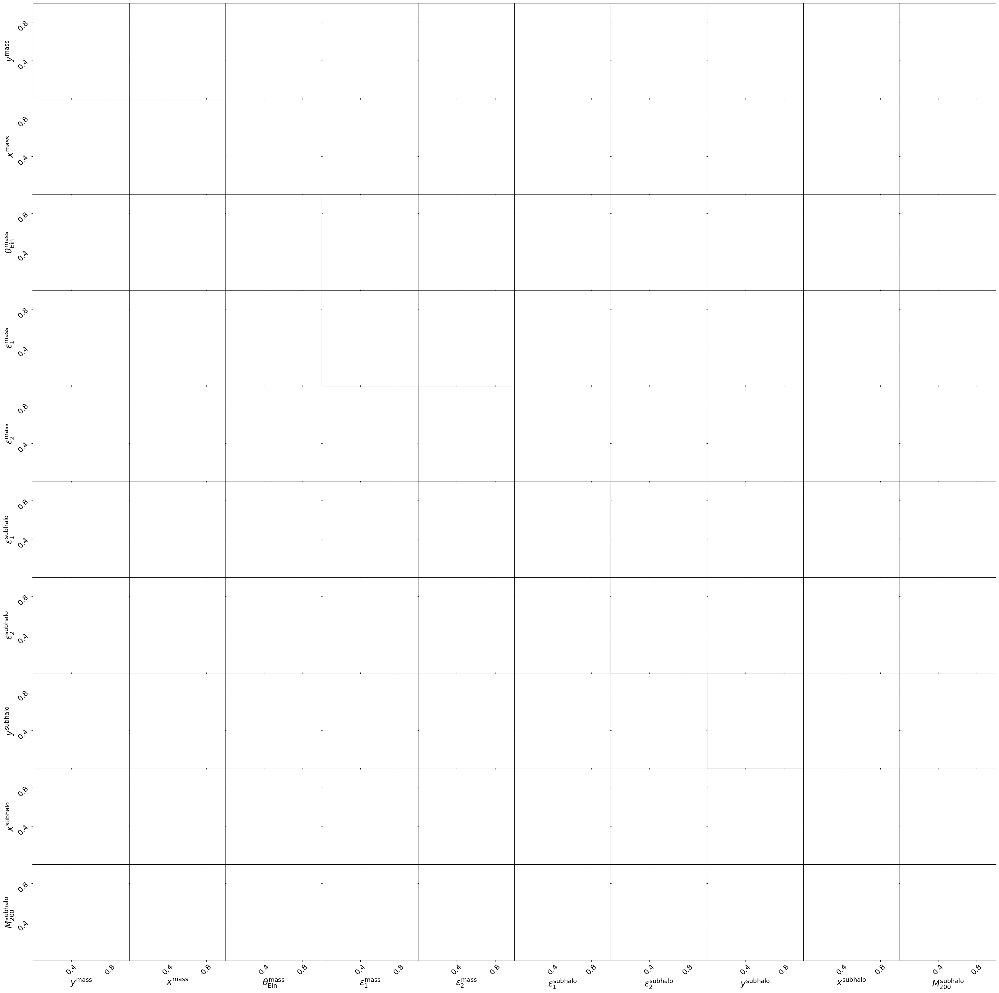

<Figure size 1200x1200 with 0 Axes>

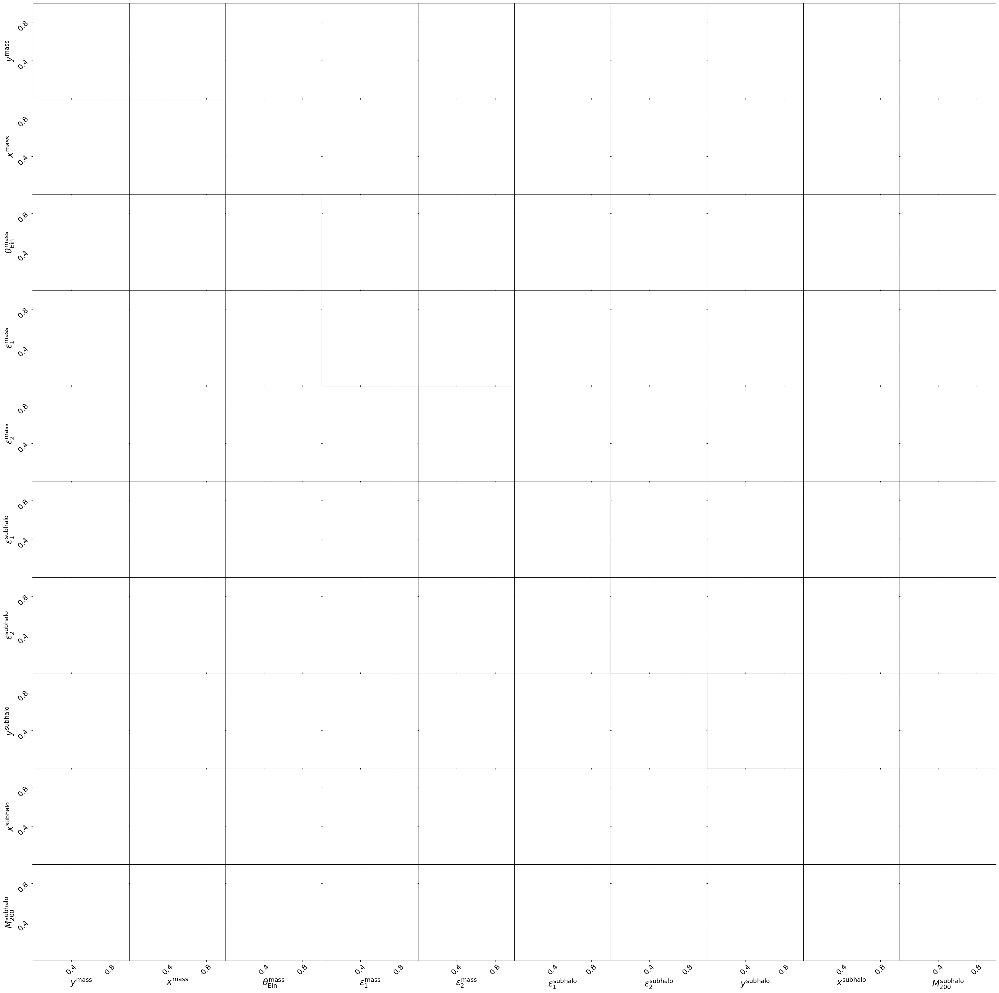

<Figure size 1200x1200 with 0 Axes>

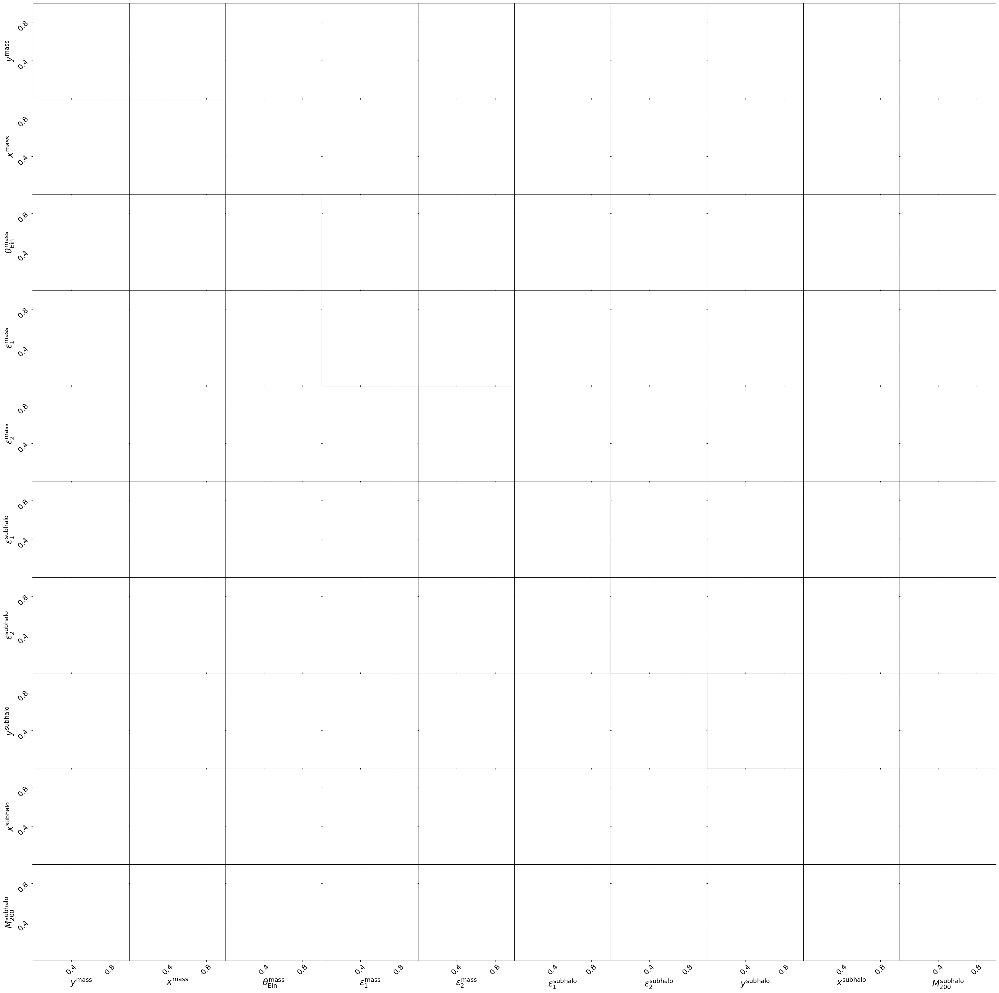

<Figure size 1200x1200 with 0 Axes>

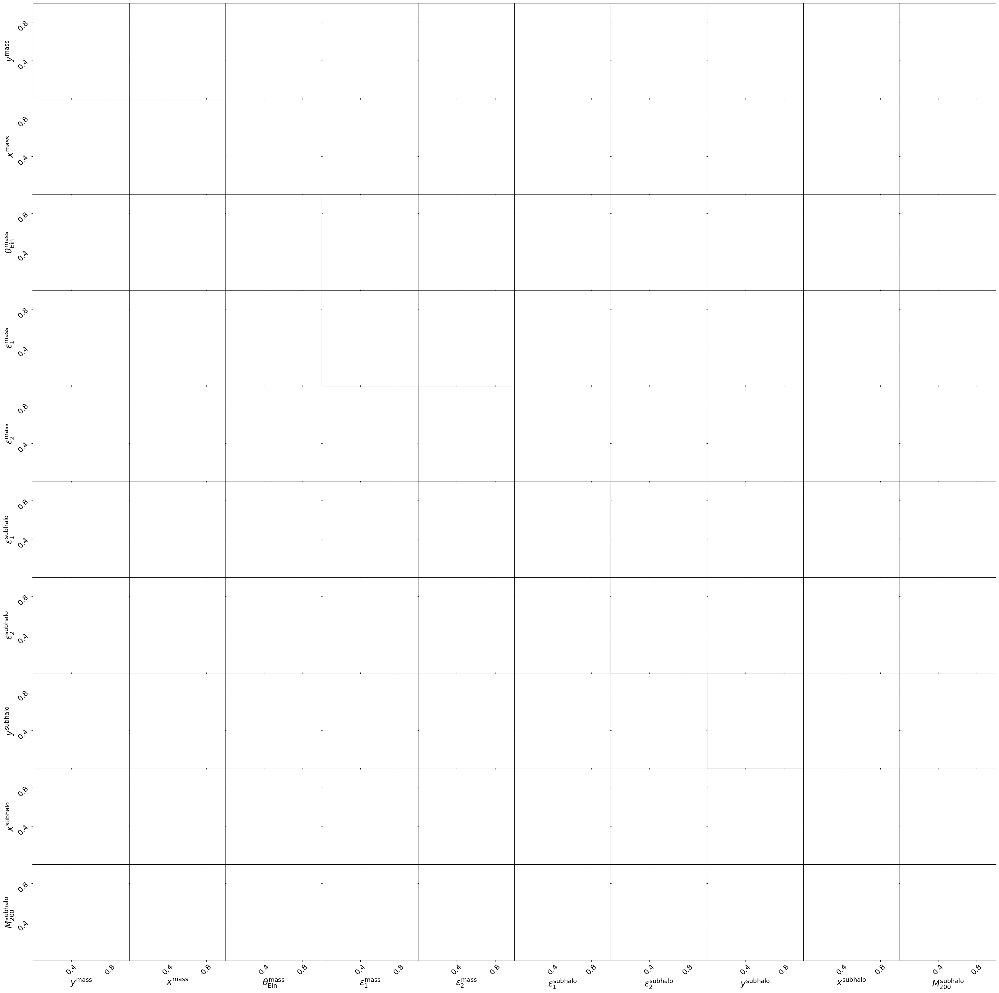

<Figure size 1200x1200 with 0 Axes>

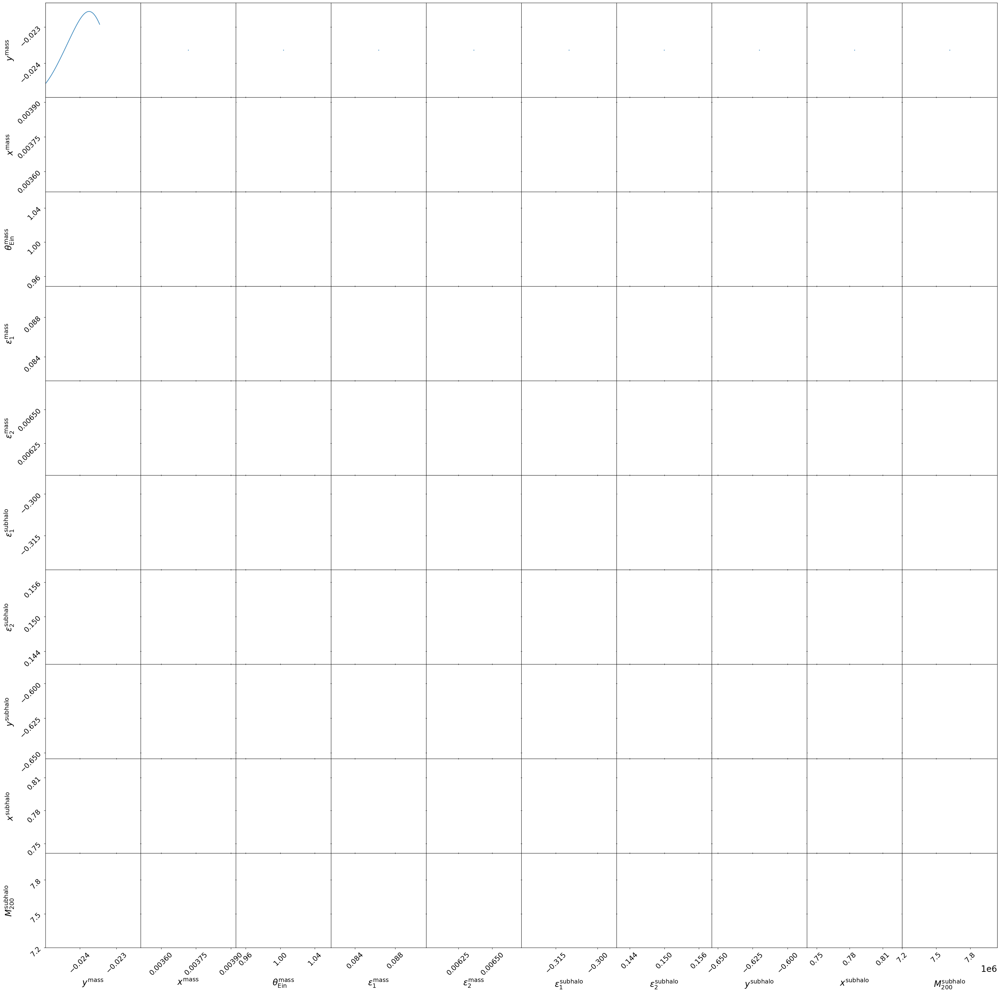

<Figure size 1200x1200 with 0 Axes>

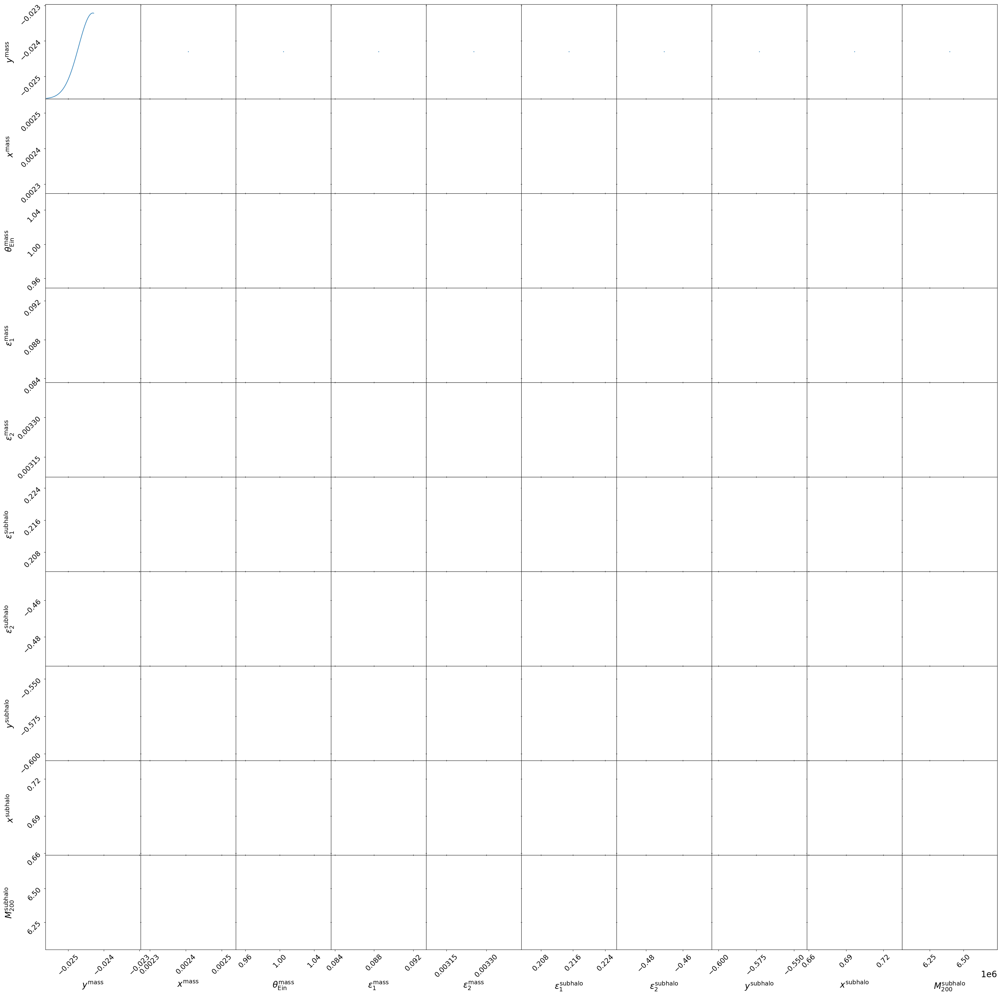

<Figure size 1200x1200 with 0 Axes>

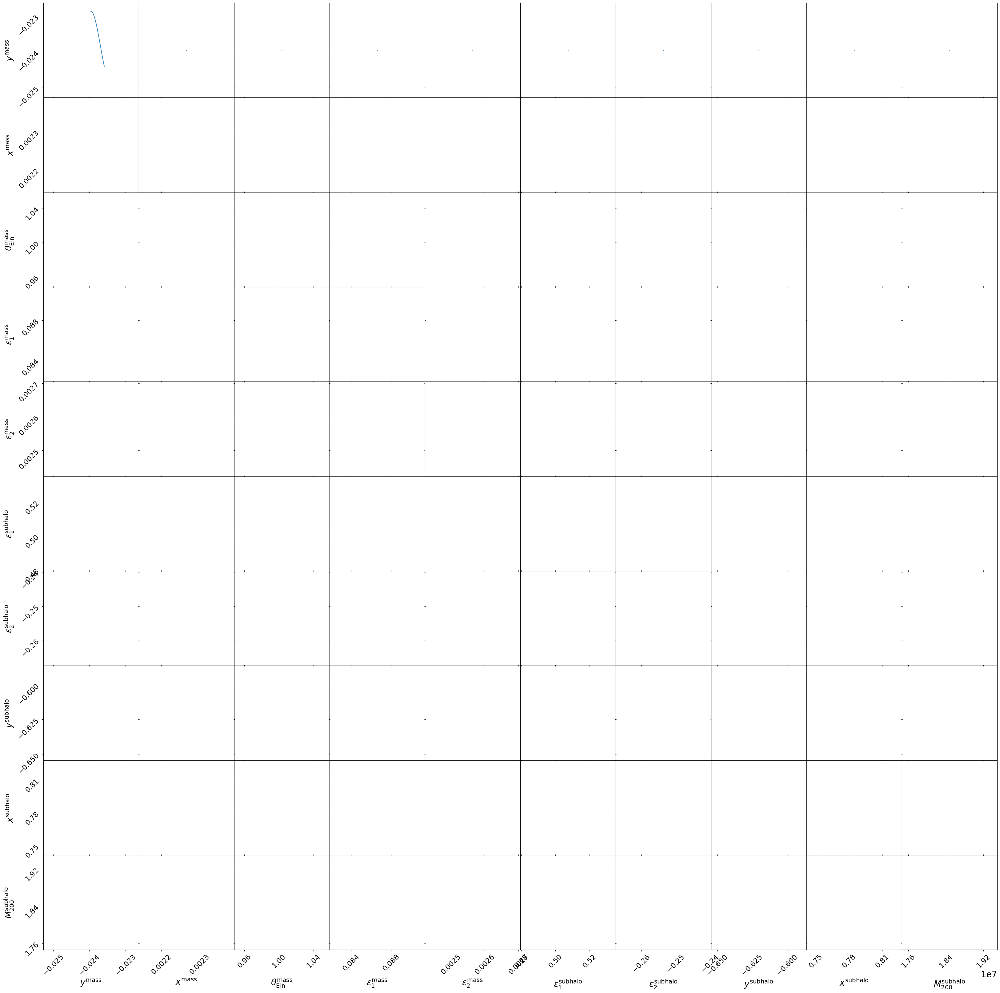

<Figure size 1200x1200 with 0 Axes>

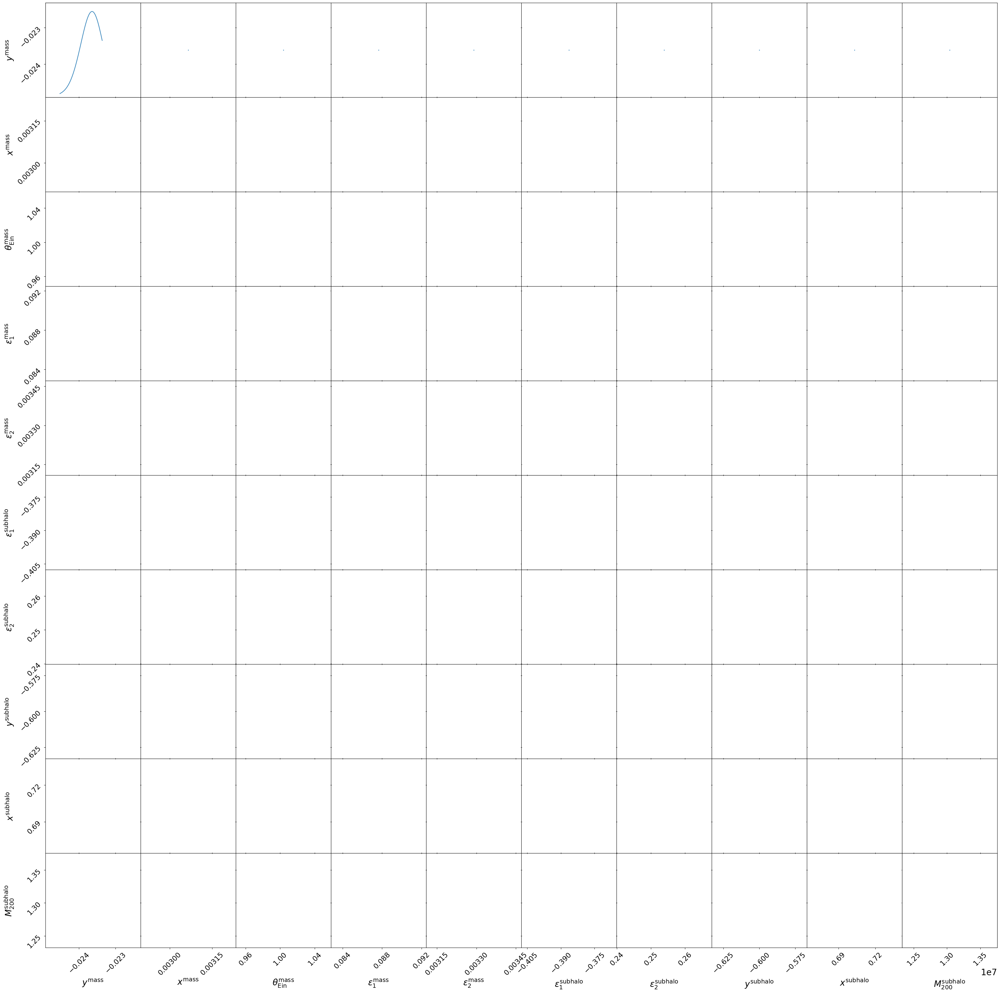

<Figure size 1200x1200 with 0 Axes>

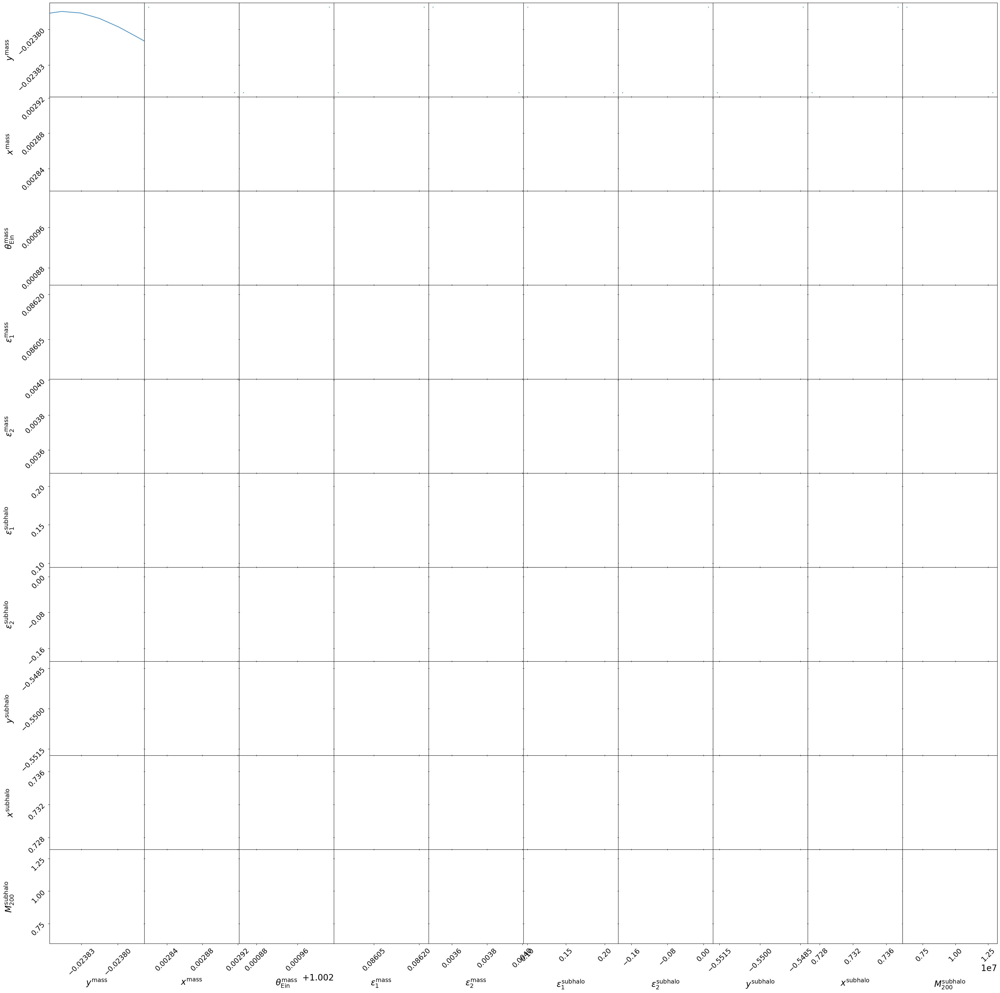

<Figure size 1200x1200 with 0 Axes>

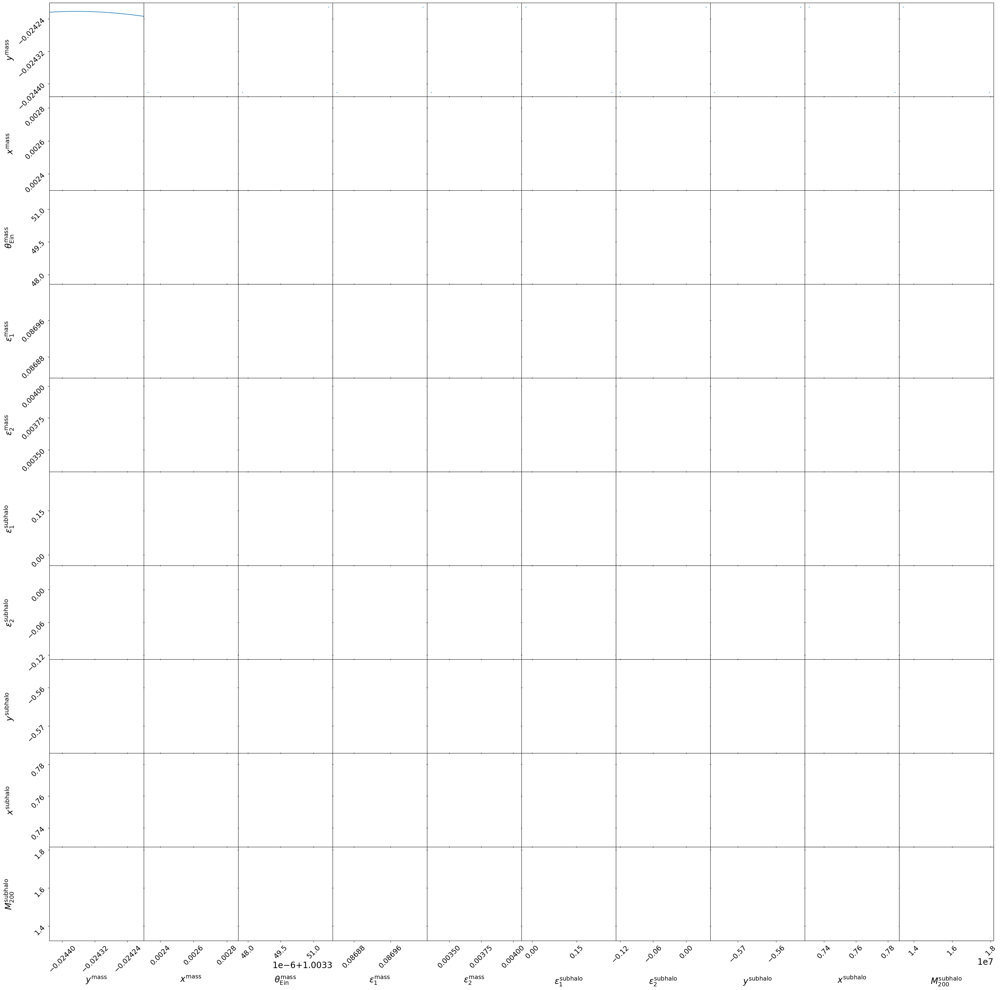

<Figure size 1200x1200 with 0 Axes>

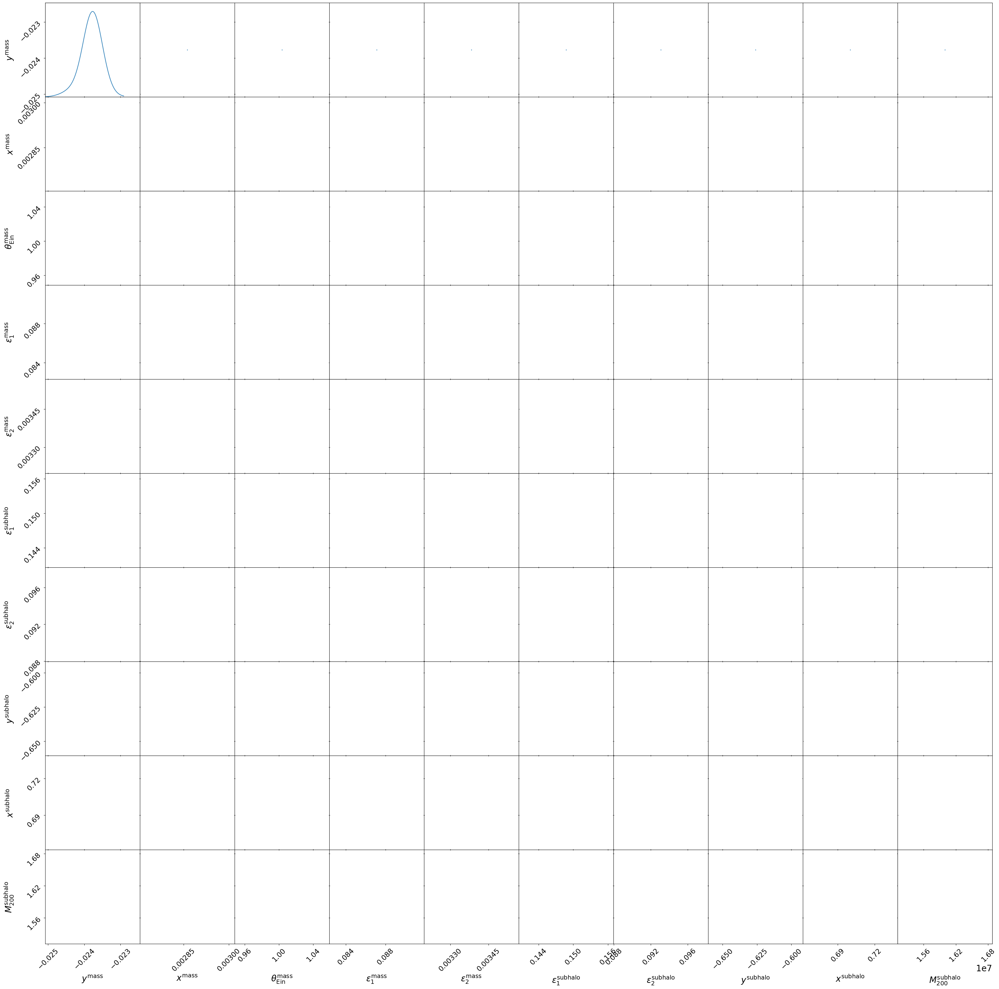

<Figure size 1200x1200 with 0 Axes>

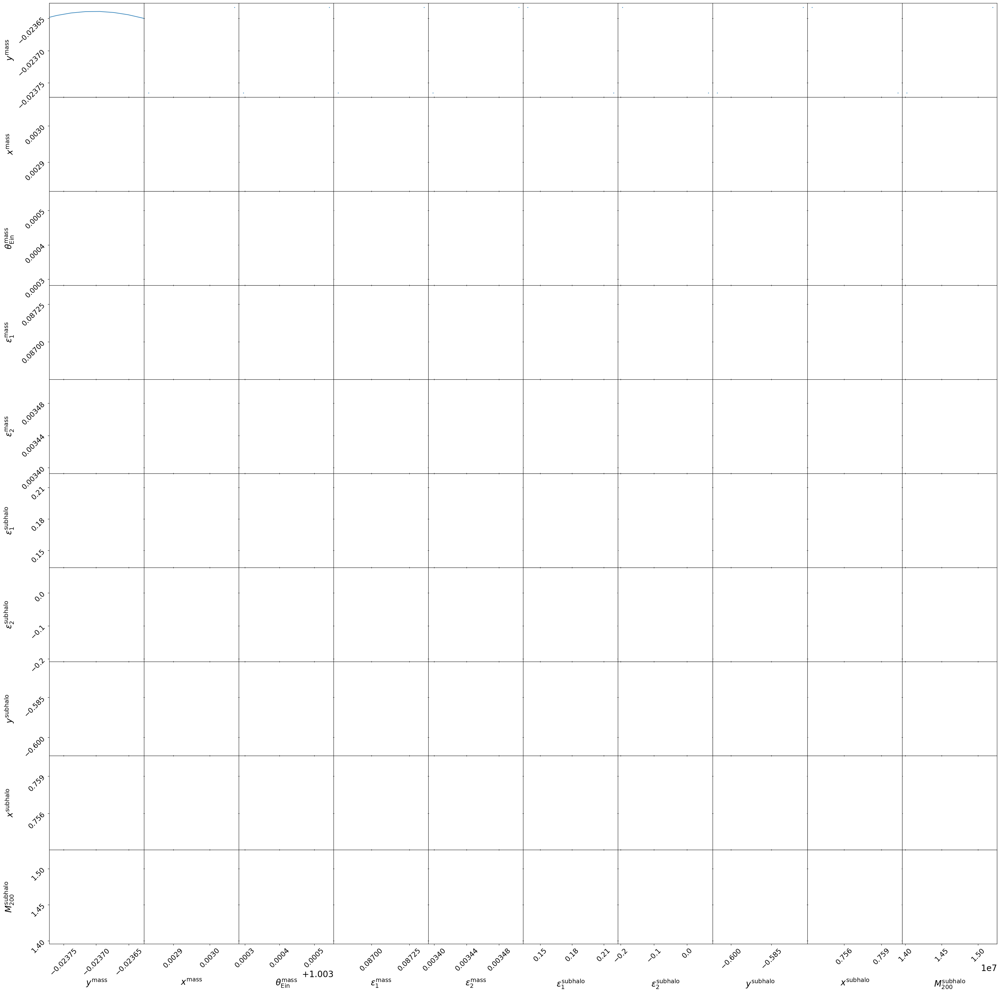

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

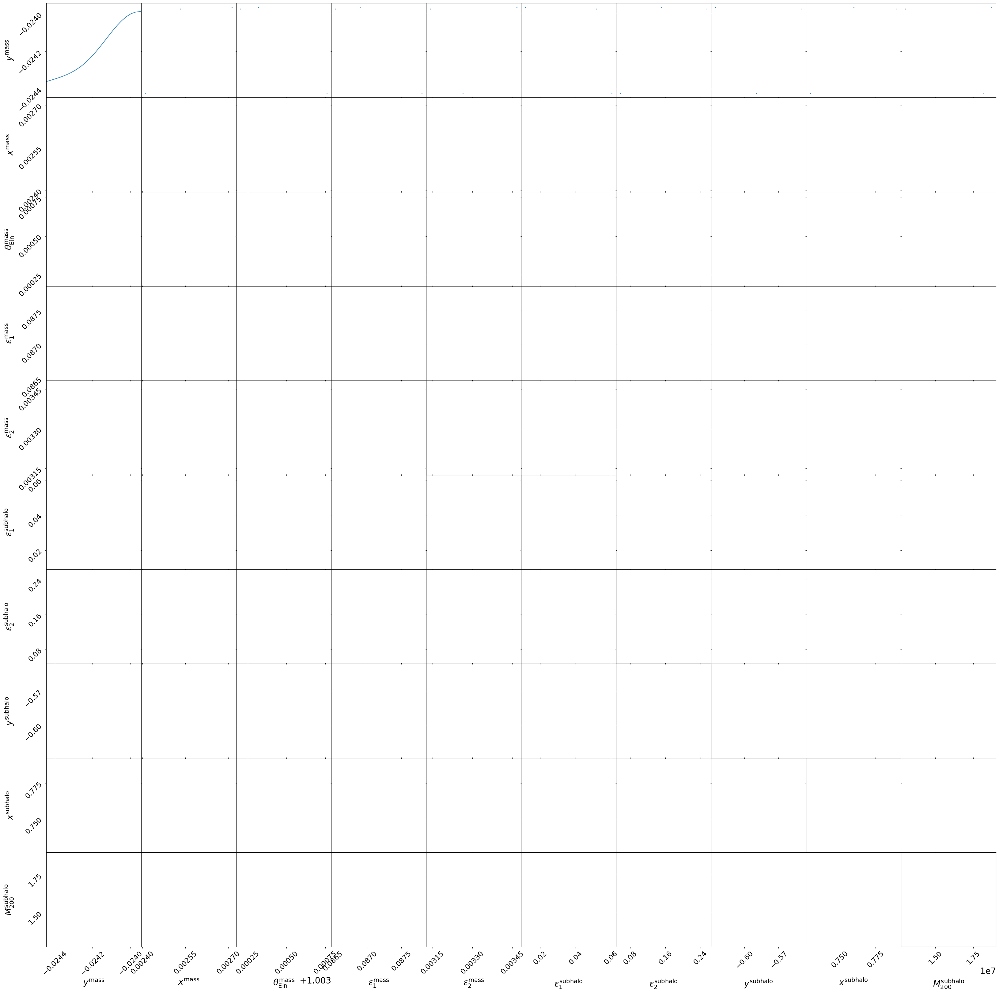

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

In [35]:
# ========================================
# Cell 8: Fit Model with Subhalo
# ========================================

print("Fitting model with subhalo...")

# Fix lens mass and source to best-fit from null model
lens_galaxy_with_sub = af.Model(
    al.Galaxy,
    redshift=lensing_data.lens_redshift,
    mass=lens_mass_model,  # Free parameters
    shear=shear_model,     # Free parameters
    subhalo=subhalo_model, # Free parameters
)

# Fix source to best-fit
source_galaxy_fixed = result_null.instance.galaxies.source

# Combine into model
model_with_sub = af.Collection(
    galaxies=af.Collection(
        lens=lens_galaxy_with_sub,
        source=source_galaxy_fixed,  # Fixed from null fit
    )
)

# Create analysis
analysis_with_sub = al.AnalysisImaging(
    dataset=imaging_masked,
)

# Configure search - use more live points for subhalo
# Using Nautilus for consistency and memory efficiency
search_with_sub = af.Nautilus(
    path_prefix=str(search_output_path),
    name="subhalo_model_nautilus",
    unique_tag="with_subhalo",
    n_live=100,  # More live points for subhalo detection
    number_of_cores=3,  # ALWAYS 1 for safety
)

print(f"\nStarting subhalo model fit...")
print(f"  - Number of free parameters: {model_with_sub.total_free_parameters}")
print(f"  - Fixed components: lens mass, shear, source")
print(f"  - Free parameters: subhalo (x, y, M200)")

# Perform the fit
start_time = datetime.now()

try:
    result_with_sub = search_with_sub.fit(model=model_with_sub, analysis=analysis_with_sub)
    fit_time_sub = (datetime.now() - start_time).total_seconds()
    
    print(f"\n✅ Subhalo model fit completed!")
    print(f"   Time taken: {fit_time_sub/60:.1f} minutes")
    
except Exception as e:
    print(f"\n❌ Error during subhalo fitting: {e}")
    raise

In [39]:
# ========================================
# Cell 8b: Analyze Subhalo Model Results
# ========================================

print("Analyzing subhalo model results...")

# Check if result_with_sub exists
if 'result_with_sub' not in locals():
    raise ValueError("result_with_sub not found! Run Cell 8 first.")

print(f"Log evidence: {result_with_sub.samples.log_evidence:.2f}")

# Find the correct way to get max log likelihood
max_ll_sub = None

# Try different methods to get the numerical log likelihood
try:
    # Method 1: max_log_likelihood_list
    if hasattr(result_with_sub.samples, 'max_log_likelihood_list'):
        max_ll_sub = max(result_with_sub.samples.max_log_likelihood_list)
        print(f"Max log likelihood: {max_ll_sub:.2f} (from max_log_likelihood_list)")
except:
    pass

if max_ll_sub is None:
    try:
        # Method 2: log_likelihood_list
        if hasattr(result_with_sub.samples, 'log_likelihood_list'):
            max_ll_sub = max(result_with_sub.samples.log_likelihood_list)
            print(f"Max log likelihood: {max_ll_sub:.2f} (from log_likelihood_list)")
    except:
        pass

if max_ll_sub is None:
    try:
        # Method 3: Through the fit object
        fit = result_with_sub.max_log_likelihood_fit
        if hasattr(fit, 'log_likelihood'):
            max_ll_sub = fit.log_likelihood
            print(f"Max log likelihood: {max_ll_sub:.2f} (from fit.log_likelihood)")
    except:
        pass

if max_ll_sub is None:
    print("Warning: Could not find max_log_likelihood value")
    print("Available result attributes:", [attr for attr in dir(result_with_sub) if 'likelihood' in attr.lower()][:5])
    print("Available samples attributes:", [attr for attr in dir(result_with_sub.samples) if 'likelihood' in attr.lower()][:5])

# Extract best-fit subhalo parameters
best_fit_sub = result_with_sub.max_log_likelihood_instance
recovered_sub = best_fit_sub.galaxies.lens.subhalo
print("\nRecovered subhalo parameters:")
print(f"  - Mass: {recovered_sub.mass_at_200:.2e} M_sun")
print(f"  - Position: ({recovered_sub.centre[0]:.3f}, {recovered_sub.centre[1]:.3f})")
print(f"  - Mass error: {(recovered_sub.mass_at_200 - true_subhalo_mass)/true_subhalo_mass * 100:.1f}%")
print(f"  - Position error: {np.sqrt((recovered_sub.centre[0] - true_subhalo_pos[0])**2 + (recovered_sub.centre[1] - true_subhalo_pos[1])**2):.3f} arcsec")

# Save subhalo results
subhalo_results_summary = {
    'log_evidence': float(result_with_sub.samples.log_evidence),
    'max_log_likelihood': float(max_ll_sub) if max_ll_sub is not None else None,
    'recovered_mass': float(recovered_sub.mass_at_200),
    'recovered_centre_0': float(recovered_sub.centre[0]),
    'recovered_centre_1': float(recovered_sub.centre[1]),
    'true_mass': float(true_subhalo_mass),
    'true_centre_0': float(true_subhalo_pos[0]),
    'true_centre_1': float(true_subhalo_pos[1]),
    'mass_error_percent': float((recovered_sub.mass_at_200 - true_subhalo_mass)/true_subhalo_mass * 100),
    'position_error_arcsec': float(np.sqrt((recovered_sub.centre[0] - true_subhalo_pos[0])**2 + (recovered_sub.centre[1] - true_subhalo_pos[1])**2)),
    'fit_time_seconds': float(fit_time_sub) if 'fit_time_sub' in locals() else None
}

# Save to file
with open(search_output_path / 'subhalo_model_summary.json', 'w') as f:
    json.dump(subhalo_results_summary, f, indent=2)
print("\n✅ Results saved to subhalo_model_summary.json")

Analyzing subhalo model results...
Log evidence: -52019.56
Max log likelihood: -51975.54 (from log_likelihood_list)

Recovered subhalo parameters:
  - Mass: 1.98e+07 M_sun
  - Position: (-0.631, 0.792)
  - Mass error: 98.3%
  - Position error: 0.061 arcsec

✅ Results saved to subhalo_model_summary.json


In [40]:
# ========================================
# Cell 9: Calculate Detection Significance
# ========================================

print("Calculating detection significance...")

# Let's explore what attributes are available on the result object
print("\nExploring result attributes to find log likelihood...")
print("Result null attributes containing 'likelihood':")
likelihood_attrs = [attr for attr in dir(result_null) if 'likelihood' in attr.lower()]
for attr in likelihood_attrs[:10]:  # Show first 10
    print(f"  - {attr}")

print("\nResult null.samples attributes containing 'likelihood':")
samples_likelihood_attrs = [attr for attr in dir(result_null.samples) if 'likelihood' in attr.lower()]
for attr in samples_likelihood_attrs[:10]:  # Show first 10
    print(f"  - {attr}")

# Try different approaches to get the numerical log likelihood
max_ll_null = None
max_ll_sub = None

# Method 1: Try max_log_likelihood_list
try:
    if hasattr(result_null.samples, 'max_log_likelihood_list'):
        max_ll_null = max(result_null.samples.max_log_likelihood_list)
        max_ll_sub = max(result_with_sub.samples.max_log_likelihood_list)
        print(f"\nFound max log likelihoods via max_log_likelihood_list")
except:
    pass

# Method 2: Try log_likelihood_list
if max_ll_null is None:
    try:
        if hasattr(result_null.samples, 'log_likelihood_list'):
            max_ll_null = max(result_null.samples.log_likelihood_list)
            max_ll_sub = max(result_with_sub.samples.log_likelihood_list)
            print(f"\nFound max log likelihoods via log_likelihood_list")
    except:
        pass

# Method 3: Try accessing through the fit
if max_ll_null is None:
    try:
        # Get the fits
        fit_null = result_null.max_log_likelihood_fit
        fit_sub = result_with_sub.max_log_likelihood_fit
        
        # Try to get log likelihood from fit
        if hasattr(fit_null, 'log_likelihood'):
            max_ll_null = fit_null.log_likelihood
            max_ll_sub = fit_sub.log_likelihood
            print(f"\nFound max log likelihoods via fit.log_likelihood")
    except:
        pass

# Method 4: Load from saved JSON files
if max_ll_null is None:
    try:
        with open(search_output_path / 'null_model_summary.json', 'r') as f:
            null_summary = json.load(f)
            max_ll_null = null_summary.get('max_log_likelihood')
            
        with open(search_output_path / 'subhalo_model_summary.json', 'r') as f:
            sub_summary = json.load(f)
            max_ll_sub = sub_summary.get('max_log_likelihood')
            
        if max_ll_null is not None and max_ll_sub is not None:
            print(f"\nLoaded max log likelihoods from saved JSON files")
    except:
        pass

if max_ll_null is None or max_ll_sub is None:
    print("\n⚠️ Could not find numerical log likelihood values")
    print("Skipping detection significance calculation")
    print("You may need to check the PyAutoLens API documentation for your version")
else:
    print(f"\nMax log likelihood (null): {max_ll_null:.2f}")
    print(f"Max log likelihood (subhalo): {max_ll_sub:.2f}")
    
    # Method 1: Likelihood ratio test
    delta_log_likelihood = max_ll_sub - max_ll_null
    delta_chi2 = 2 * delta_log_likelihood  # -2 * log(likelihood ratio)
    
    # Degrees of freedom = 3 (subhalo x, y, mass)
    n_params_subhalo = 3
    
    # Simple significance estimate (√Δχ²)
    significance_simple = np.sqrt(max(0, delta_chi2))
    
    # Corrected for degrees of freedom
    significance_corrected = np.sqrt(max(0, delta_chi2 - n_params_subhalo))
    
    print(f"\nLikelihood-based significance:")
    print(f"  - Δ log likelihood: {delta_log_likelihood:.2f}")
    print(f"  - Δχ²: {delta_chi2:.2f}")
    print(f"  - Simple significance (√Δχ²): {significance_simple:.1f}σ")
    print(f"  - Corrected significance: {significance_corrected:.1f}σ")
    
    # Detection threshold
    detection_threshold = 3.0  # 3σ
    is_detected = significance_corrected > detection_threshold
    
    print(f"\nDetection result:")
    print(f"  - Threshold: {detection_threshold}σ")
    print(f"  - Detected: {is_detected}")

# Method 2: Bayesian evidence ratio (this should still work)
if hasattr(result_with_sub.samples, 'log_evidence') and hasattr(result_null.samples, 'log_evidence'):
    log_bayes_factor = result_with_sub.samples.log_evidence - result_null.samples.log_evidence
    print(f"\nBayesian evidence:")
    print(f"  - Log Bayes factor: {log_bayes_factor:.2f}")
    print(f"  - Bayes factor: {np.exp(log_bayes_factor):.2e}")
    
    # Jeffrey's scale interpretation
    if log_bayes_factor < 0:
        print(f"  - Interpretation: Evidence against subhalo")
    elif log_bayes_factor < 1:
        print(f"  - Interpretation: Barely worth mentioning")
    elif log_bayes_factor < 2.5:
        print(f"  - Interpretation: Positive evidence")
    elif log_bayes_factor < 5:
        print(f"  - Interpretation: Strong evidence")
    else:
        print(f"  - Interpretation: Very strong evidence")

Calculating detection significance...

Exploring result attributes to find log likelihood...
Result null attributes containing 'likelihood':
  - log_likelihood
  - max_log_likelihood_fit
  - max_log_likelihood_galaxies
  - max_log_likelihood_instance
  - max_log_likelihood_positions_threshold
  - max_log_likelihood_tracer
  - positions_likelihood_from

Result null.samples attributes containing 'likelihood':
  - log_likelihood
  - log_likelihood_list
  - max_log_likelihood
  - max_log_likelihood_index
  - max_log_likelihood_sample

Found max log likelihoods via log_likelihood_list

Max log likelihood (null): -51984.25
Max log likelihood (subhalo): -51975.54

Likelihood-based significance:
  - Δ log likelihood: 8.71
  - Δχ²: 17.42
  - Simple significance (√Δχ²): 4.2σ
  - Corrected significance: 3.8σ

Detection result:
  - Threshold: 3.0σ
  - Detected: True

Bayesian evidence:
  - Log Bayes factor: 52.97
  - Bayes factor: 1.01e+23
  - Interpretation: Very strong evidence


Creating visualization...


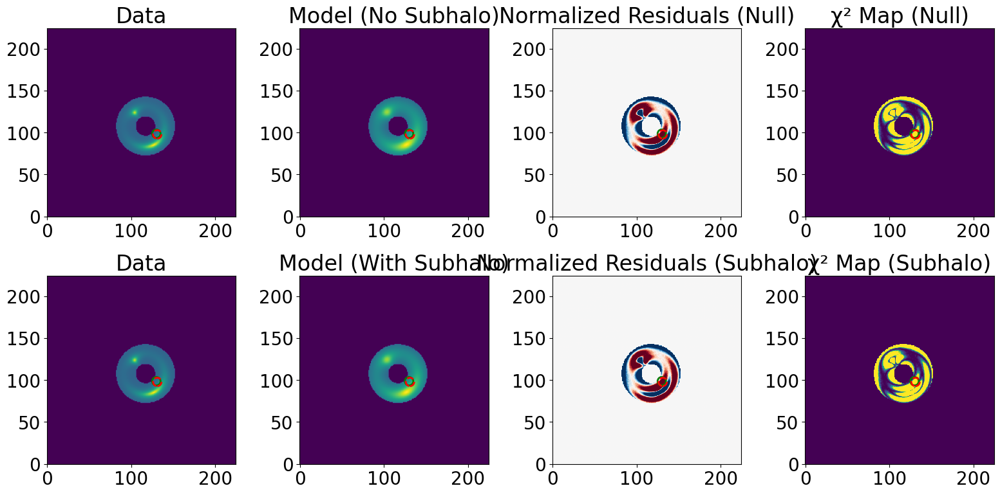


DETECTION SUMMARY
True subhalo mass: 1.00e+07 M_sun
Recovered mass: 1.98e+07 M_sun (+98.3%)
Position error: 0.061 arcsec
Detection significance: 3.8σ
Detected (>3σ): True


In [41]:
# ========================================
# Cell 10: Visualize Results
# ========================================

print("Creating visualization...")

# Create figure with subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Row 1: Data, Model, Residuals (Null)
fit_null = result_null.max_log_likelihood_fit
axes[0, 0].imshow(fit_null.data.native, origin='lower')
axes[0, 0].set_title('Data')
axes[0, 1].imshow(fit_null.model_data.native, origin='lower')
axes[0, 1].set_title('Model (No Subhalo)')
axes[0, 2].imshow(fit_null.normalized_residual_map.native, origin='lower', cmap='RdBu', vmin=-3, vmax=3)
axes[0, 2].set_title('Normalized Residuals (Null)')
axes[0, 3].imshow(fit_null.chi_squared_map.native, origin='lower', vmin=0, vmax=9)
axes[0, 3].set_title('χ² Map (Null)')

# Row 2: Model with subhalo
fit_sub = result_with_sub.max_log_likelihood_fit
axes[1, 0].imshow(fit_sub.data.native, origin='lower')
axes[1, 0].set_title('Data')
axes[1, 1].imshow(fit_sub.model_data.native, origin='lower')
axes[1, 1].set_title('Model (With Subhalo)')
axes[1, 2].imshow(fit_sub.normalized_residual_map.native, origin='lower', cmap='RdBu', vmin=-3, vmax=3)
axes[1, 2].set_title('Normalized Residuals (Subhalo)')
axes[1, 3].imshow(fit_sub.chi_squared_map.native, origin='lower', vmin=0, vmax=9)
axes[1, 3].set_title('χ² Map (Subhalo)')

# Mark subhalo positions
# Convert from arcsec to pixel coordinates
# Note: PyAutoLens uses centered coordinates, so (0,0) is at the image center
data_shape = fit_null.data.shape_native
pixel_scale = imaging_masked.pixel_scales[0]

for ax in axes.flat:
    # True position - convert from arcsec to pixels
    true_y_pix = true_subhalo_pos[0] / pixel_scale + data_shape[0] / 2
    true_x_pix = true_subhalo_pos[1] / pixel_scale + data_shape[1] / 2
    
    circle_true = plt.Circle(
        (true_x_pix, true_y_pix),
        radius=5, fill=False, color='green', linewidth=2, label='True'
    )
    ax.add_patch(circle_true)
    
    # Recovered position
    if is_detected:
        rec_y_pix = recovered_sub.centre[0] / pixel_scale + data_shape[0] / 2
        rec_x_pix = recovered_sub.centre[1] / pixel_scale + data_shape[1] / 2
        
        circle_rec = plt.Circle(
            (rec_x_pix, rec_y_pix),
            radius=5, fill=False, color='red', linewidth=2, linestyle='--', label='Recovered'
        )
        ax.add_patch(circle_rec)

plt.tight_layout()
plt.savefig(search_output_path / 'detection_comparison.png', dpi=150)
plt.show()

# Summary statistics
print("\n" + "="*50)
print("DETECTION SUMMARY")
print("="*50)
print(f"True subhalo mass: {true_subhalo_mass:.2e} M_sun")
print(f"Recovered mass: {recovered_sub.mass_at_200:.2e} M_sun ({(recovered_sub.mass_at_200/true_subhalo_mass - 1)*100:+.1f}%)")
print(f"Position error: {np.sqrt((recovered_sub.centre[0] - true_subhalo_pos[0])**2 + (recovered_sub.centre[1] - true_subhalo_pos[1])**2):.3f} arcsec")
print(f"Detection significance: {significance_corrected:.1f}σ")
print(f"Detected (>3σ): {is_detected}")